In [27]:
gene

'TRNFRNR1TRNVRNR2TRNL1nad1TRNITRNQTRNMnad2TRNWNoneTRNNTRNCTRNYcox1TRNS1TRNDcox2TRNKatp8atp6cox3TRNGnad3TRNRnad4Lnad4TRNHTRNS2TRNL2nad5nad6TRNEcobTRNTTRNP'

In [25]:
import pandas as pd
import numpy as np
import os
from importlib import reload
import matplotlib.pyplot as plt
import seaborn as sns
import consts
import utils
from statannotations.Annotator import Annotator
import enhanced_mtdna_dnds_analysis_biopython as mda
import enhanced_sequence_logo_creator as slc
import clean_amb_and_gaps as cag
from ast import literal_eval
# Import reverse complement from Bio
from Bio.Seq import reverse_complement
reload(consts)
reload(utils)
reload(mda)
reload(slc)
reload(cag)
PATH = os.path.dirname(os.getcwd())
UNIVERSAL_OFFSET = 0

# Set the plotting style
plt.style.use('seaborn-v0_8-whitegrid')
NEG_STRAND = ['SHLP1', 'SHLP2', 'SHLP3', 'SHLP4', 'SHLP5', 'GAU']
overlap_df = pd.read_csv(os.path.join(PATH, 'data', 'gene_overlap_positions.csv'))

overlap_df['Gene1'] = overlap_df['Gene1'].str.replace('MT-', '')
overlap_df['Gene2'] = overlap_df['Gene2'].str.replace('MT-', '')

# Load the gene coordinates from hs_row.csv
hs_row = pd.read_csv(os.path.join(PATH, 'data', 'hs_row.csv'), index_col=0)
# Convert to series
# Literal eval gene order and gene locations
hs_row = hs_row.iloc[0, :]

hs_row['gene_order'] = literal_eval(hs_row['gene_order'])
hs_row['gene_locations'] =literal_eval(hs_row['gene_locations'])

REPLACEMENT_DICT = {
    'nad1' : 'ND1', 
    'nad2' : 'ND2',
    'nad3' : 'ND3',
    'nad4' : 'ND4',
    'nad4L' : 'ND4L', 
    'nad5' : 'ND5', 
    'nad6' : 'ND6',
    'cob' : 'CYTB',
    'cox1': 'COX1', 
    'cox2': 'COX2',
    'cox3' : 'COX3',
    'atp6' : 'ATP6', 
    'atp8' : 'ATP8',
}
# Make a dict of lists gene_name:[start, end, strand]
hs_genes = {}
for gene, loc in zip(hs_row['gene_order'], hs_row['gene_locations']):
    loc = loc.split(':')
    try: 
        gene = REPLACEMENT_DICT[gene]
    except KeyError:
        pass
    gene_start = int(loc[0])
    gene_end = int(loc[1])
    gene_strand = loc[2]

    hs_genes[gene] = [gene_start, gene_end, gene_strand]

# Grab ND4L, ND4, ATP8 and ATP6
hs_genes['ND4L_ND4'] = [hs_genes['ND4L'][0], hs_genes['ND4'][1], hs_genes['ND4L'][-1]]
hs_genes['ATP8_ATP6'] = [hs_genes['ATP8'][0], hs_genes['ATP6'][1], hs_genes['ATP8'][-1]]
hs_genes['TS2_TL2_ND5'] = [hs_genes['TRNS2'][0], hs_genes['ND5'][1], hs_genes['TRNS2'][-1]]
 
# Replace nad with ND, cox with CO, cob with CYTB and atp with ATP
overlap_df['overlap_name'] = overlap_df.apply(lambda x : f'{x[0]}_{x[1]}', axis = 1)
# Remove TER from the overlaps
overlap_df = overlap_df[overlap_df['Gene1'] != 'TER']
overlap_df = overlap_df[overlap_df['Gene2'] != 'TER']

co1_overlaps = []
rnr2_overlaps = []
rnr1_overlaps = []
nad4L_overlaps = []
nad4_overlaps = []
atp8_overlaps = []
cyb_overlaps = []
shmoose_overlaps = []
gau_overlaps = []
# Before retrieving the overlap regions, change the overlap coordinates from absolute to relative to the gene/gene pair

for _, row in overlap_df.iterrows():
    gene1 = row['Gene1']
    gene2 = row['Gene2']
    if gene1 == 'RNR2' or gene2 == 'RNR2':
        if gene1 == 'RNR2':
            name = gene2
        else:
            name = gene1
        if name not in NEG_STRAND:
            rnr2_overlaps.append([row['Overlap_Start'] + UNIVERSAL_OFFSET -1, row['Overlap_End'] + UNIVERSAL_OFFSET, name])
        else:
            rnr2_overlaps.append([row['Overlap_Start'] + UNIVERSAL_OFFSET-1, row['Overlap_End'] + UNIVERSAL_OFFSET, name])
    
    if gene1 == 'RNR1' or gene2 == 'RNR1':
        if gene1 == 'RNR1':
            name = gene2
        else:
            name = gene1
        rnr1_overlaps.append([row['Overlap_Start']+ UNIVERSAL_OFFSET-1, row['Overlap_End']+ UNIVERSAL_OFFSET, name])
    
    if gene1 == 'CO1' or gene2 == 'CO1':
        if gene2 == 'GAU' and gene1 == 'CO1':
            name = gene2
            gau_overlaps.append([row['Overlap_Start'] + UNIVERSAL_OFFSET -1 , row['Overlap_End'] + UNIVERSAL_OFFSET, name])
        elif gene1 == 'GAU':
            continue
        elif gene1 == 'CO1' and gene2 == 'ALTCO1':
            name = gene2
            co1_overlaps.append([row['Overlap_Start'] + UNIVERSAL_OFFSET -1, row['Overlap_End'] + UNIVERSAL_OFFSET+2, name])
   
    if gene1 == 'ALTND4' or gene2 == 'ALTND4':
        if gene1 == 'ALTND4':
            name = gene1
        else:
            name = gene2
        nad4_overlaps.append([row['Overlap_Start'] + UNIVERSAL_OFFSET-1, row['Overlap_End'] + UNIVERSAL_OFFSET-1, name])
   
    if gene1 == 'ND4L' or gene2 == 'ND4L':
        if gene1 == 'ND4L':
            name = gene2
        else:
            name = gene1
        name = 'Overlap Region'
        nad4L_overlaps.append([row['Overlap_Start'] + UNIVERSAL_OFFSET-1, row['Overlap_End'] + UNIVERSAL_OFFSET, name])
    
    if gene1 == 'ATP8' or gene2 == 'ATP8':
        if gene1 == 'ATP8':
            name = gene2
        else:
            name = gene1
        name = 'Overlap Region'
        atp8_overlaps.append([row['Overlap_Start'] + UNIVERSAL_OFFSET-1, row['Overlap_End'] + UNIVERSAL_OFFSET, name])
    
    if gene1 == 'CYB' or gene2 == 'CYB':
        if gene1 == 'CYB':
            name = gene2
        else:
            name = gene1
        cyb_overlaps.append([row['Overlap_Start'] + UNIVERSAL_OFFSET-1, row['Overlap_End'] + UNIVERSAL_OFFSET, name])

    if gene1 == 'TS2_TL2_ND5':
        name = gene2
        shmoose_overlaps.append([row['Overlap_Start'] + UNIVERSAL_OFFSET-1, row['Overlap_End'] + UNIVERSAL_OFFSET, name])

def abs_to_gene_coords(start, end, gene_start, gene_end, strand):
    if strand == '1' or strand == '+':
        rel_start = int(start - gene_start)
        rel_end = int(end - gene_start)
    else:
        rel_start = int(gene_end - end)
        rel_end = int(gene_end - start)
    return rel_start, rel_end

KeyError: 'ND4L'

In [2]:
#!/usr/bin/env python3
"""
create_mtdna_gff3.py - Create GFF3 files for mitochondrial ribosome profiling analysis
"""

# YOUR OVERLAP DATA - EDIT THIS SECTION WITH YOUR ACTUAL COORDINATES
# ====================================================================

rnr2_overlaps = [
    [1702, 1819, 'SHLP3'],
    [2087, 2168, 'SHLP2'],
    [2441, 2522, 'SHLP4'],
    [2484, 2559, 'SHLP1'],
    [2632, 2707, 'Hum'],
    [2779, 2854, 'SHLP5'],
    [2989, 3052, 'SHLP6']
]

# Add more overlap variables here as needed:
# nd2_overlaps = [[start, end, 'name'], ...]
# co1_overlaps = [[start, end, 'name'], ...]
# etc.

# STRAND INFORMATION (optional but recommended)
# '+' for forward strand, '-' for reverse strand
strand_info = {
    'SHLP3': '-',
    'SHLP2': '-',
    'SHLP4': '-',
    'SHLP1': '-',
    'Hum': '+',
    'SHLP5': '-',
    'SHLP6': '+',
    'MOTS-c': '+',
    'SHMOOSE' : '+',
    'GAU' : '-',
    'ALTND4': '+',
    'CYTB-187AA': '+',
    'ALTCO1': '+'


}

# ====================================================================
# NO NEED TO EDIT BELOW THIS LINE
# ====================================================================

def create_gff3_files():
    """Create GFF3 files from the overlap data defined above"""
    
    # Combine all overlap data
    all_overlaps = {
        'MT-RNR2': rnr2_overlaps,
        'MT-RNR1': rnr1_overlaps,
        'MT-ND4': nad4_overlaps,
        'MT-COX1' : co1_overlaps + gau_overlaps,
        'MT-CYTB': cyb_overlaps,

        # Add more as you define them above:
        # 'MT-ND2': nd2_overlaps,
        # 'MT-CO1': co1_overlaps,
    }
    
    # Remove empty entries
    all_overlaps = {k: v for k, v in all_overlaps.items() if v}
    
    # Create overlaps GFF3
    with open(os.path.join(PATH, 'data', "mitochondrial_overlaps.gff3"), 'w') as f:
        f.write("##gff-version 3\n")
        f.write("##description: Mitochondrial microproteins and alternative reading frames\n")
        f.write("##sequence-region MT 1 16569\n")
        f.write("##\n")
        
        feature_id = 1
        for parent_gene, overlaps in sorted(all_overlaps.items()):
            for start, end, name in sorted(overlaps):
                strand = strand_info.get(name, '+')
                
                attrs = f"ID=overlap_{feature_id:03d};Name={name};Parent={parent_gene};product={name}"
                
                line = '\t'.join([
                    'MT',
                    'MitoOverlap_Analysis',
                    'CDS',
                    str(start),
                    str(end),
                    '.',
                    strand,
                    '0',
                    attrs
                ])
                f.write(line + '\n')
                feature_id += 1
    
    print(f"✓ Created mitochondrial_overlaps.gff3 ({feature_id-1} features)")
    
    # Create canonical genes GFF3
    canonical_genes = [
        ('MT-ND1', 3307, 4262, '+', 'NADH dehydrogenase subunit 1'),
        ('MT-ND2', 4470, 5511, '+', 'NADH dehydrogenase subunit 2'),
        ('MT-CO1', 5904, 7445, '+', 'Cytochrome c oxidase subunit 1'),
        ('MT-CO2', 7586, 8269, '+', 'Cytochrome c oxidase subunit 2'),
        ('MT-ATP8', 8366, 8572, '+', 'ATP synthase F0 subunit 8'),
        ('MT-ATP6', 8527, 9207, '+', 'ATP synthase F0 subunit 6'),
        ('MT-CO3', 9207, 9990, '+', 'Cytochrome c oxidase subunit 3'),
        ('MT-ND3', 10059, 10404, '+', 'NADH dehydrogenase subunit 3'),
        ('MT-ND4L', 10470, 10766, '+', 'NADH dehydrogenase subunit 4L'),
        ('MT-ND4', 10760, 12137, '+', 'NADH dehydrogenase subunit 4'),
        ('MT-ND5', 12337, 14148, '+', 'NADH dehydrogenase subunit 5'),
        ('MT-ND6', 14149, 14673, '-', 'NADH dehydrogenase subunit 6'),
        ('MT-CYB', 14747, 15887, '+', 'Cytochrome b'),
        ('MT-RNR1', 648, 1601, '+', '12S ribosomal RNA'),
        ('MT-RNR2', 1671, 3229, '+', '16S ribosomal RNA'),
    ]
    
    with open("canonical_mtdna_genes.gff3", 'w') as f:
        f.write("##gff-version 3\n")
        f.write("##description: Canonical human mitochondrial genes\n")
        f.write("##sequence-region MT 1 16569\n")
        f.write("##\n")
        
        for name, start, end, strand, product in canonical_genes:
            feature_type = 'rRNA' if name.startswith('MT-RNR') else 'CDS'
            phase = '0' if feature_type == 'CDS' else '.'
            
            attrs = f"ID={name};Name={name};product={product}"
            
            line = '\t'.join([
                'MT',
                'RefSeq',
                feature_type,
                str(start),
                str(end),
                '.',
                strand,
                phase,
                attrs
            ])
            f.write(line + '\n')
    
    print(f"✓ Created canonical_mtdna_genes.gff3 ({len(canonical_genes)} features)")
    
    # Print summary
    print("\n" + "="*60)
    print("SUMMARY")
    print("="*60)
    print("\nOverlaps per parent gene:")
    for parent, overlaps in sorted(all_overlaps.items()):
        print(f"  {parent}: {len(overlaps)} overlaps")
    
    print("\n" + "="*60)
    print("NEXT STEPS")
    print("="*60)
    print("\n1. Run the ribosome profiling analysis:")
    print("   python mito_riboseq_analysis.py \\")
    print("       mapped_riboseq.bam \\")
    print("       MT.fa \\")
    print("       canonical_mtdna_genes.gff3 \\")
    print("       mitochondrial_overlaps.gff3 \\")
    print("       -o results/analysis")
    print("\n2. View in genome browser (optional):")
    print("   Load the GFF3 files in IGV or UCSC Genome Browser")
    print()


if __name__ == '__main__':
    create_gff3_files()

✓ Created mitochondrial_overlaps.gff3 (12 features)
✓ Created canonical_mtdna_genes.gff3 (15 features)

SUMMARY

Overlaps per parent gene:
  MT-COX1: 2 overlaps
  MT-CYTB: 1 overlaps
  MT-ND4: 1 overlaps
  MT-RNR1: 1 overlaps
  MT-RNR2: 7 overlaps

NEXT STEPS

1. Run the ribosome profiling analysis:
   python mito_riboseq_analysis.py \
       mapped_riboseq.bam \
       MT.fa \
       canonical_mtdna_genes.gff3 \
       mitochondrial_overlaps.gff3 \
       -o results/analysis

2. View in genome browser (optional):
   Load the GFF3 files in IGV or UCSC Genome Browser



In [3]:
reload(utils)
# Generate the hs_pop_df dataframe:
rnr2_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'RNR2_all.fasta')).set_index('ID').rename(columns = {'sequence' : 'RNR2'})
rnr1_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'RNR1_all.fasta')).set_index('ID').rename(columns = {'sequence' : 'RNR1'})
ATP8_ATP6_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'ATP8_ATP6_all.fasta'), polya = False).set_index('ID').rename(columns = {'sequence' : 'ATP8_ATP6'})
ND4L_ND4_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'ND4L_ND4_all.fasta'), polya = True).set_index('ID').rename(columns = {'sequence' : 'ND4L_ND4'})
ND4_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'ND4_all.fasta'), polya = True).set_index('ID').rename(columns = {'sequence' : 'ND4'})
CO1_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'COX1_all.fasta'), polya = False).set_index('ID').rename(columns = {'sequence' : 'COX1'})
CYTB_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'CYTB_all.fasta'), polya = True).set_index('ID').rename(columns = {'sequence' : 'CYTB'})
TS2_TL2_ND5_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'TRNS2_TRNL2_ND5_all.fasta'), polya = False).set_index('ID').rename(columns = {'sequence' : 'TS2_TL2_ND5'})
ND4L_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'ND4L_all.fasta'), polya = False).set_index('ID').rename(columns = {'sequence' : 'ND4L'})
ATP8_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'ATP8_all.fasta'), polya = False).set_index('ID').rename(columns = {'sequence' : 'ATP8'})
ATP6_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'ATP6_all.fasta'), polya = False).set_index('ID').rename(columns = {'sequence' : 'ATP6'})
# Add all the other canonical genes (ND1, ND2, ND3, ND5, ND6, CO2, CO3)
ND1_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'ND1_all.fasta'), polya = True).set_index('ID').rename(columns = {'sequence' : 'ND1'})
ND2_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'ND2_all.fasta'), polya = True).set_index('ID').rename(columns = {'sequence' : 'ND2'})
ND3_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'ND3_all.fasta'), polya = True).set_index('ID').rename(columns = {'sequence' : 'ND3'})
ND5_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'ND5_all.fasta'), polya = False).set_index('ID').rename(columns = {'sequence' : 'ND5'})
ND6_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'ND6_all.fasta'), polya = False).set_index('ID').rename(columns = {'sequence' : 'ND6'})
CO2_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'COX2_all.fasta'), polya = False).set_index('ID').rename(columns = {'sequence' : 'COX2'})
CO3_df = utils.fasta_to_df(os.path.join(PATH, 'data', 'hs_pop_seq', 'per_gene_alignment_fasta', 'COX3_all.fasta'), polya = True).set_index('ID').rename(columns = {'sequence' : 'COX3'})

# Add PolyA when necessary

hs_pop_df = pd.concat([rnr2_df, rnr1_df, ATP8_df, ATP6_df, ATP8_ATP6_df, ND4L_ND4_df, ND4_df, ND4L_df, CO1_df, CYTB_df, TS2_TL2_ND5_df, ND1_df, ND2_df, ND3_df, ND5_df, ND6_df, CO2_df, CO3_df], axis=1)
# Drop rows if NA in all columns
hs_pop_df = hs_pop_df.dropna(how='all')
# Replace all float values with NA
hs_pop_df = hs_pop_df.applymap(lambda x: np.nan if isinstance(x, float) else x)
# Make sure that the lenghs of the sequences of each column are all the same
for col in hs_pop_df.columns:
    hs_pop_df_temp = hs_pop_df.dropna(subset = [col])
    seq_lengths = hs_pop_df_temp[col].apply(len)
    assert len(set(seq_lengths)) == 1, f'Sequence lengths in column {col} are not the same! Lengths: {set(seq_lengths)}'
    del hs_pop_df_temp
    
ATP8_end = 207
# Fill NA values in ATP8 using the sequence from ATP8_ATP6
for idx, row in hs_pop_df.iterrows():
    if pd.isna(row['ATP8']):
        atp8_atp6_seq = row['ATP8_ATP6']
        if pd.isna(atp8_atp6_seq):
            continue
        atp8_seq = atp8_atp6_seq[:ATP8_end]
        hs_pop_df.at[idx, 'ATP8'] = atp8_seq
hs_pop_df.to_parquet(os.path.join(PATH, 'data', 'hs_pop_df.parquet'))


Reference sequence (NC_012920.1) expected length: 1670

Reference sequence (NC_012920.1) expected length: 1380

Reference sequence (NC_012920.1) expected length: 1143

Reference sequence (NC_012920.1) expected length: 957

Reference sequence (NC_012920.1) expected length: 1044

Reference sequence (NC_012920.1) expected length: 348

Reference sequence (NC_012920.1) expected length: 786


In [4]:
# Convert all overlap coordinates to relative coordinates
print(shmoose_overlaps, hs_genes['TS2_TL2_ND5'])
shmoose_overlaps_rel = abs_to_gene_coords(shmoose_overlaps[0][0], shmoose_overlaps[0][1], hs_genes['TS2_TL2_ND5'][0], hs_genes['TS2_TL2_ND5'][1], hs_genes['TS2_TL2_ND5'][2])
shmoose_overlaps_rel = [shmoose_overlaps[0][-1], shmoose_overlaps_rel[0], shmoose_overlaps_rel[1]]

rnr1_overlaps_rel = []
for overlap in rnr1_overlaps:
    rel_coords = abs_to_gene_coords(overlap[0], overlap[1], hs_genes['RNR1'][0], hs_genes['RNR1'][1], hs_genes['RNR1'][2])
    rnr1_overlaps_rel.append([overlap[-1], rel_coords[0], rel_coords[1]])
rnr2_overlaps_rel = []
for overlap in rnr2_overlaps:
    rel_coords = abs_to_gene_coords(overlap[0], overlap[1], hs_genes['RNR2'][0], hs_genes['RNR2'][1], hs_genes['RNR2'][2])
    rnr2_overlaps_rel.append([overlap[-1], rel_coords[0], rel_coords[1]])
co1_overlaps_rel = []
for overlap in co1_overlaps:
    rel_coords = abs_to_gene_coords(overlap[0], overlap[1], hs_genes['COX1'][0], hs_genes['COX1'][1], hs_genes['COX1'][2])
    co1_overlaps_rel.append([overlap[-1], rel_coords[0], rel_coords[1]])
gau_overlaps_rel = []
for overlap in gau_overlaps:
    rel_coords = abs_to_gene_coords(overlap[0], overlap[1], hs_genes['COX1'][0], hs_genes['COX1'][1], hs_genes['COX1'][2])
    gau_overlaps_rel.append([overlap[-1], rel_coords[0], rel_coords[1]])
shmoose_overlaps_rel = []
for overlap in shmoose_overlaps:
    rel_coords = abs_to_gene_coords(overlap[0], overlap[1], hs_genes['TS2_TL2_ND5'][0], hs_genes['TS2_TL2_ND5'][1], hs_genes['TS2_TL2_ND5'][2])
    shmoose_overlaps_rel.append([overlap[-1], rel_coords[0], rel_coords[1]])
nad4_overlaps_rel = []
for overlap in nad4_overlaps:
    rel_coords = abs_to_gene_coords(overlap[0], overlap[1], hs_genes['ND4'][0], hs_genes['ND4'][1], hs_genes['ND4'][2])
    nad4_overlaps_rel.append([overlap[-1], rel_coords[0], rel_coords[1]])
nad4L_nad4_overlaps_rel = []
for overlap in nad4L_overlaps:
    rel_coords = abs_to_gene_coords(overlap[0], overlap[1], hs_genes['ND4L_ND4'][0], hs_genes['ND4L_ND4'][1], hs_genes['ND4L_ND4'][2])
    nad4L_nad4_overlaps_rel.append([overlap[-1], rel_coords[0], rel_coords[1]])
atp8_atp6_overlaps_rel = []
for overlap in atp8_overlaps:
    rel_coords = abs_to_gene_coords(overlap[0], overlap[1], hs_genes['ATP8_ATP6'][0], hs_genes['ATP8_ATP6'][1], hs_genes['ATP8_ATP6'][2])
    atp8_atp6_overlaps_rel.append([overlap[-1], rel_coords[0], rel_coords[1]])
cyb_overlaps_rel = []
for overlap in cyb_overlaps:
    rel_coords = abs_to_gene_coords(overlap[0], overlap[1], hs_genes['CYTB'][0], hs_genes['CYTB'][1], hs_genes['CYTB'][2])
    cyb_overlaps_rel.append([overlap[-1], rel_coords[0], rel_coords[1]])


[[12233, 12410, 'SHMOOSE']] [12206, 14148, '1']


In [5]:
# Save all relative overlap coords nested lists into a json file
import json
overlap_coords_rel_dict = {
    'rnr2_overlaps_rel' : rnr2_overlaps_rel,
    'rnr1_overlaps_rel' : rnr1_overlaps_rel,
    'co1_overlaps_rel' : co1_overlaps_rel,
    'gau_overlaps_rel' : gau_overlaps_rel,
    'shmoose_overlaps_rel' : shmoose_overlaps_rel,
    'nad4_overlaps_rel' : nad4_overlaps_rel,
    'nad4L_nad4_overlaps_rel' : nad4L_nad4_overlaps_rel,
    'atp8_atp6_overlaps_rel' : atp8_atp6_overlaps_rel,
    'cyb_overlaps_rel' : cyb_overlaps_rel
}
with open(os.path.join(PATH, 'data', 'overlap_coords_rel.json'), 'w') as f:
    json.dump(overlap_coords_rel_dict, f, indent=4)



In [6]:
import json
# Save a dict with all the overlaps as a json file
overlaps_dict = {
    'RNR2': rnr2_overlaps,
    'RNR1': rnr1_overlaps,
    'CO1': co1_overlaps,
    'ALTND4': nad4_overlaps,
    'ND4L': nad4L_overlaps,
    'ATP8': atp8_overlaps,
    'CYB': cyb_overlaps,
    'SHMOOSE': shmoose_overlaps,
    'GAU': gau_overlaps
}
json_path = os.path.join(PATH, 'data', 'overlap_coords.json')
with open(json_path, 'w') as f:
    json.dump(overlaps_dict, f, indent=4)
    

In [7]:
hs_pop_df['ATP8_ATP6'].iloc[0][161:164]

'ATG'

In [8]:
hs_pop_df['Hum_seq'] = hs_pop_df.apply(lambda x : x['RNR2'][int(rnr2_overlaps_rel[4][1]):int(rnr2_overlaps_rel[4][2])] if isinstance(x['RNR2'], str) else np.nan, axis = 1)
hs_pop_df['SHLP3_seq'] = hs_pop_df.apply(lambda x : reverse_complement(x['RNR2'][rnr2_overlaps_rel[0][1]:rnr2_overlaps_rel[0][2]]) if isinstance(x['RNR2'], str) else np.nan, axis = 1)
hs_pop_df['SHLP2_seq'] = hs_pop_df.apply(lambda x : reverse_complement(x['RNR2'][rnr2_overlaps_rel[1][1]:rnr2_overlaps_rel[1][2]]) if isinstance(x['RNR2'], str) else np.nan, axis = 1)
hs_pop_df['SHLP4_seq'] = hs_pop_df.apply(lambda x : reverse_complement(x['RNR2'][rnr2_overlaps_rel[2][1]:rnr2_overlaps_rel[2][2]]) if isinstance(x['RNR2'], str) else np.nan, axis = 1)
hs_pop_df['SHLP1_seq'] = hs_pop_df.apply(lambda x : reverse_complement(x['RNR2'][rnr2_overlaps_rel[3][1]:rnr2_overlaps_rel[3][2]]) if isinstance(x['RNR2'], str) else np.nan, axis = 1)
hs_pop_df['SHLP5_seq'] = hs_pop_df.apply(lambda x : reverse_complement(x['RNR2'][rnr2_overlaps_rel[5][1]:rnr2_overlaps_rel[5][2]]) if isinstance(x['RNR2'], str) else np.nan, axis = 1)
hs_pop_df['SHLP6_seq'] = hs_pop_df.apply(lambda x : x['RNR2'][rnr2_overlaps_rel[6][1]:rnr2_overlaps_rel[6][2]] if isinstance(x['RNR2'], str) else np.nan, axis = 1)
hs_pop_df['MOTC_seq'] = hs_pop_df.apply(lambda x : x['RNR1'][rnr1_overlaps_rel[0][1]:rnr1_overlaps_rel[0][2]] if isinstance(x['RNR1'], str) else np.nan, axis = 1)
hs_pop_df['GAU_seq'] = hs_pop_df.apply(lambda x : reverse_complement(x['COX1'][gau_overlaps_rel[0][1]:gau_overlaps_rel[0][2]]) if isinstance(x['COX1'], str) else np.nan, axis = 1)
hs_pop_df['shmoose_seq'] = hs_pop_df.apply(lambda x : x['TS2_TL2_ND5'][shmoose_overlaps_rel[0][1]:shmoose_overlaps_rel[0][2]] if isinstance(x['TS2_TL2_ND5'], str) else np.nan, axis = 1)
hs_pop_df['CO1_alt_seq'] = hs_pop_df.apply(lambda x : x['COX1'][co1_overlaps_rel[0][1]:co1_overlaps_rel[0][2]] if isinstance(x['COX1'], str) else np.nan, axis = 1)
hs_pop_df['ND4_alt_seq'] = hs_pop_df.apply(lambda x : x['ND4'][nad4_overlaps_rel[0][1]:nad4_overlaps_rel[0][2]] if isinstance(x['ND4'], str) else np.nan, axis = 1)
hs_pop_df['CYB_alt_seq'] = hs_pop_df.apply(lambda x : x['CYTB'][cyb_overlaps_rel[0][1]:cyb_overlaps_rel[0][2]] if isinstance(x['CYTB'], str) else np.nan, axis = 1)
hs_pop_df['ATP8_6_overlap_seq_upstream'] = hs_pop_df.apply(lambda x : x['ATP8_ATP6'][atp8_atp6_overlaps_rel[0][1] - 2:atp8_atp6_overlaps_rel[0][2]] if isinstance(x['ATP8_ATP6'], str) else np.nan, axis = 1)
hs_pop_df['ATP8_6_overlap_seq_downstream'] = hs_pop_df.apply(lambda x : x['ATP8_ATP6'][atp8_atp6_overlaps_rel[0][1]:atp8_atp6_overlaps_rel[0][2] - 1] if isinstance(x['ATP8_ATP6'], str) else np.nan, axis = 1)
hs_pop_df['ND4L_4_overlap_seq_upstream'] = hs_pop_df.apply(lambda x : x['ND4L_ND4'][nad4L_nad4_overlaps_rel[0][1] - 2:nad4L_nad4_overlaps_rel[0][2]] if isinstance(x['ND4L_ND4'], str) else np.nan, axis = 1)
hs_pop_df['ND4L_4_overlap_seq_downstream'] = hs_pop_df.apply(lambda x : x['ND4L_ND4'][nad4L_nad4_overlaps_rel[0][1]:nad4L_nad4_overlaps_rel[0][2] - 1] if isinstance(x['ND4L_ND4'], str) else np.nan, axis = 1)



hs_pop_df = hs_pop_df.reset_index()
hs_pop_df['ID'] = hs_pop_df['ID'].str.replace('.', '')
hs_pop_df.to_csv(os.path.join(PATH, 'data', 'hs_pop_df_with_overlap_sequences_per_gene.csv'), index=False)

In [9]:
hs_pop_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66328 entries, 0 to 66327
Data columns (total 36 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   ID                             66328 non-null  object
 1   RNR2                           64933 non-null  object
 2   RNR1                           65719 non-null  object
 3   ATP8                           66321 non-null  object
 4   ATP6                           66311 non-null  object
 5   ATP8_ATP6                      66320 non-null  object
 6   ND4L_ND4                       66313 non-null  object
 7   ND4                            66316 non-null  object
 8   ND4L                           66270 non-null  object
 9   COX1                           66315 non-null  object
 10  CYTB                           66314 non-null  object
 11  TS2_TL2_ND5                    66271 non-null  object
 12  ND1                            66305 non-null  object
 13  N

In [10]:
# Save the hu_seq as a fasta file
with open(os.path.join(PATH, 'data', 'hs_pop_seq', 'rnr2_hu_seq.fasta'), 'w') as f:
    for i, row in hs_pop_df.iterrows():
        f.write(f'>{row["ID"]}\n')
        f.write(f'{row["Hum_seq"]}\n')
# Save the SHLP3_seq as a fasta file
with open(os.path.join(PATH, 'data', 'hs_pop_seq', 'rnr2_shlp3_seq.fasta'), 'w') as f:
    for i, row in hs_pop_df.iterrows():
        f.write(f'>{row["ID"]}\n')
        f.write(f'{row["SHLP3_seq"]}\n')
# Save the SHLP2_seq as a fasta file
with open(os.path.join(PATH, 'data', 'hs_pop_seq', 'rnr2_shlp2_seq.fasta'), 'w') as f:
    for i, row in hs_pop_df.iterrows():
        f.write(f'>{row["ID"]}\n')
        f.write(f'{row["SHLP2_seq"]}\n')
# Save the SHLP4_seq as a fasta file
with open(os.path.join(PATH, 'data', 'hs_pop_seq', 'rnr2_shlp4_seq.fasta'), 'w') as f:
    for i, row in hs_pop_df.iterrows():
        f.write(f'>{row["ID"]}\n')
        f.write(f'{row["SHLP4_seq"]}\n')
# Save the SHLP1_seq as a fasta file
with open(os.path.join(PATH, 'data', 'hs_pop_seq', 'rnr2_shlp1_seq.fasta'), 'w') as f:
    for i, row in hs_pop_df.iterrows():
        f.write(f'>{row["ID"]}\n')
        f.write(f'{row["SHLP1_seq"]}\n')
# Save the SHLP5_seq as a fasta file
with open(os.path.join(PATH, 'data', 'hs_pop_seq', 'rnr2_shlp5_seq.fasta'), 'w') as f:
    for i, row in hs_pop_df.iterrows():
        f.write(f'>{row["ID"]}\n')
        f.write(f'{row["SHLP5_seq"]}\n')
# Save the SHLP6_seq as a fasta file
with open(os.path.join(PATH, 'data', 'hs_pop_seq', 'rnr2_shlp6_seq.fasta'), 'w') as f:
    for i, row in hs_pop_df.iterrows():
        f.write(f'>{row["ID"]}\n')
        f.write(f'{row["SHLP6_seq"]}\n')
# Save the shmoose_seq as a fasta file
with open(os.path.join(PATH, 'data', 'hs_pop_seq', 'shmoose_seq.fasta'), 'w') as f:
    for i, row in hs_pop_df.iterrows():
        f.write(f'>{row["ID"]}\n')
        f.write(f'{row["shmoose_seq"]}\n')
# Save the GAU_seq as a fasta file
with open(os.path.join(PATH, 'data', 'hs_pop_seq', 'co1_gau_seq.fasta'), 'w') as f:
    for i, row in hs_pop_df.iterrows():
        f.write(f'>{row["ID"]}\n')
        f.write(f'{row["GAU_seq"]}\n')
# Save the MOTC_seq as a fasta file
with open(os.path.join(PATH, 'data', 'hs_pop_seq', 'rnr1_motc_seq.fasta'), 'w') as f:
    for i, row in hs_pop_df.iterrows():
        f.write(f'>{row["ID"]}\n')
        f.write(f'{row["MOTC_seq"]}\n')
# Save the CO1_alt_seq as a fasta file
with open(os.path.join(PATH, 'data', 'hs_pop_seq', 'co1_alt_seq.fasta'), 'w') as f:
    for i, row in hs_pop_df.iterrows():
        f.write(f'>{row["ID"]}\n')
        f.write(f'{row["CO1_alt_seq"]}\n')
# Save the ND4_alt_seq as a fasta file
with open(os.path.join(PATH, 'data', 'hs_pop_seq', 'nd4_alt_seq.fasta'), 'w') as f:
    for i, row in hs_pop_df.iterrows():
        f.write(f'>{row["ID"]}\n')
        f.write(f'{row["ND4_alt_seq"]}\n')
# Save the CYB_alt_seq as a fasta file
with open(os.path.join(PATH, 'data', 'hs_pop_seq', 'cyb_alt_seq.fasta'), 'w') as f:
    for i, row in hs_pop_df.iterrows():
        f.write(f'>{row["ID"]}\n')
        f.write(f'{row["CYB_alt_seq"]}\n')
        

In [11]:
rnr2_overlaps

[[1702, 1819, 'SHLP3'],
 [2087, 2168, 'SHLP2'],
 [2441, 2522, 'SHLP4'],
 [2484, 2559, 'SHLP1'],
 [2632, 2707, 'Hum'],
 [2779, 2854, 'SHLP5'],
 [2989, 3052, 'SHLP6']]

In [12]:
ref_seq_rnr2 = hs_pop_df[hs_pop_df['ID'] == 'NC_0129201']['RNR2'].iloc[0]
ref_seq_rnr1 = hs_pop_df[hs_pop_df['ID'] == 'NC_0129201']['RNR1'].iloc[0]
ref_seq_shlp3 = hs_pop_df[hs_pop_df['ID'] == 'NC_0129201']['SHLP3_seq'].iloc[0]
hs_pop_df['RNR2_divisible'] = hs_pop_df['RNR2'].apply(lambda x: x[:-2] if isinstance(x, str) else np.nan)
ref_seq_rnr2_divisible = ref_seq_rnr2[:-2]

In [13]:
len(ref_seq_rnr2_divisible)

1557

In [14]:
print(hs_pop_df['SHLP4_seq'].iloc[0])
print(hs_pop_df['SHLP4_seq'].dropna().apply(len).std())
print(rnr2_overlaps_rel)

ATGCTAGAGGTGATGTTTTTGGTAAACAGGCGGGGTAAGATTTGCCGAGTTCCTTTTACTTTTTTTAACCTTTCCTTATGA
0.0
[['SHLP3', 32, 149], ['SHLP2', 417, 498], ['SHLP4', 771, 852], ['SHLP1', 814, 889], ['Hum', 962, 1037], ['SHLP5', 1109, 1184], ['SHLP6', 1319, 1382]]


2026-01-13 15:16:51,611 - INFO - Starting dN/dS analysis for RNR2
2026-01-13 15:16:51,611 - INFO - Using Biopython method: NG86
2026-01-13 15:16:51,611 - INFO - Analyzing 7 micro-protein regions
2026-01-13 15:16:51,611 - INFO - Dataset contains 64933 sequences
2026-01-13 15:16:51,611 - INFO - Within protein mode: False
2026-01-13 15:16:51,621 - WARNING - Column 'RNR2_seq' not found in DataFrame. Using RNR2 as gene sequences.
2026-01-13 15:16:51,621 - INFO - Using provided reference sequence
2026-01-13 15:16:51,621 - WARNING - No reference gene sequence provided, using reference sequence for gene analysis
2026-01-13 15:16:51,621 - INFO - Subsampled from 64933 to 64933 sequences
2026-01-13 15:16:51,621 - INFO - Analyzing micro-protein: Hum (962-1037, strand: +)
2026-01-13 15:16:51,621 - INFO - Using nuclear genetic code for Hum
2026-01-13 15:16:51,621 - INFO - Extracted reference sequence for Hum: ATGGCTCCACGAGGGTTCAGCTGTCTCTTACTTTTAACCAGTGAAATTGACCTGCCCGTGAAGAGGCGGGCATAA
2026-01-13 15:1

Using 64933 sequences for gene RNR2


2026-01-13 15:16:54,830 - INFO - out of 64933 sequences, 64725 were kept after cleaning for Hum
2026-01-13 15:16:54,830 - INFO - out of 25 codon positions, 25 were kept after cleaning for Hum
2026-01-13 15:16:54,836 - INFO - Found 37 unique variants for Hum after filtering
2026-01-13 15:16:54,910 - INFO - Total synonymous sites for Hum: 4.7276391571177205
2026-01-13 15:16:54,910 - INFO - Total non-synonymous sites for Hum: 52.25729711171193
2026-01-13 15:16:54,910 - INFO - Total synonymous differences for Hum: 0.00027206031078478795
2026-01-13 15:16:54,914 - INFO - Total non-synonymous differences for Hum: 0.006580682562272881
2026-01-13 15:16:54,914 - INFO - Synonymous rate for Hum: 0.000058
2026-01-13 15:16:54,914 - INFO - Non-synonymous rate for Hum: 0.000126
2026-01-13 15:16:54,914 - INFO -   dN/dS ratio for Hum: 2.1883
2026-01-13 15:16:54,914 - INFO -   Synonymous rate: 0.000058
2026-01-13 15:16:54,914 - INFO -   Non-synonymous rate: 0.000126
2026-01-13 15:16:54,914 - INFO -   Sta

Hum: MAPRGFSCLLLLTSEIDLPVKRRA*
Genetic code: nuclear
Coordinates adjusted: False
SHLP1: MCHWAGGASNTGDARGDVFGKQAG*
Genetic code: nuclear
Coordinates adjusted: False
SHLP2: MGVKFFTLSTRFFPSVQRAVPLWTNS*
Genetic code: nuclear
Coordinates adjusted: False
SHLP3: MLGYNFSSFPCGTISIAPGFNFYRLYFIWVNGLAKVVW*
Genetic code: nuclear
Coordinates adjusted: False
SHLP4: MLEVMFLVNRRGKICRVPFTFFNLSL*
Genetic code: nuclear
Coordinates adjusted: False
SHLP5: MYCSEVGFCSEVAPTEIFNAGLVV*
Genetic code: nuclear
Coordinates adjusted: False
SHLP6: MLDQDIPMVQPLLKVRLFND*
Genetic code: nuclear
Coordinates adjusted: False


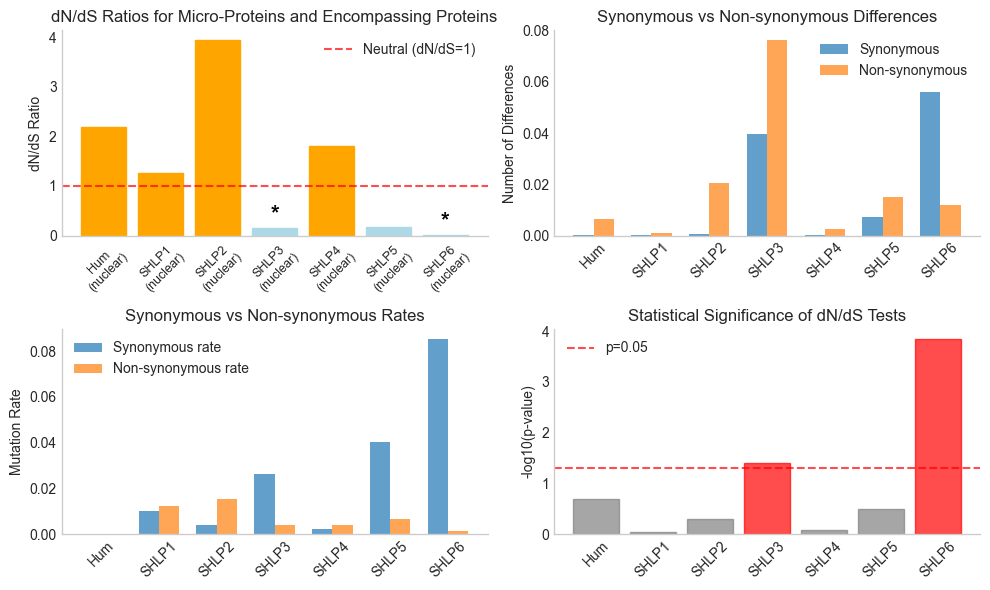

In [15]:
reload(mda)

# For RNR2 analysis
RNR2_MICROPROTEINS = [
    [962, 1037, 'Hum', '+'],
    [814, 889, 'SHLP1', '-'],
    [417, 498, 'SHLP2', '-'],
    [32, 149, 'SHLP3', '-'],
    [771, 852, 'SHLP4', '-'],
    [1109, 1184, 'SHLP5', '-'],
    [1319, 1382, 'SHLP6', '+']
]
# Define which genetic code each micro-protein uses
RNR2_GENETIC_CODES = {
    'Hum': 'nuclear',  # Translated in mitochondria
    'SHLP1': 'nuclear',         # Translated in cytoplasm
    'SHLP2': 'nuclear',
    'SHLP3': 'nuclear',
    'SHLP4': 'nuclear',
    'SHLP5': 'nuclear',
    'SHLP6': 'nuclear',
}

# Provide expected sequences for coordinate verification
RNR2_EXPECTED_SEQUENCES = {
}
# Run analysis with new features
results_rnr2 = mda.analyze_microprotein_dnds(
    df=hs_pop_df.dropna(subset=['RNR2']),
    microprotein_regions=RNR2_MICROPROTEINS,
    gene_name='RNR2',
    sequence_column='RNR2',
    expected_sequences=RNR2_EXPECTED_SEQUENCES, 
    genetic_codes=RNR2_GENETIC_CODES,          
    coordinate_search_window=50,                 
    min_coordinate_similarity=0.8,
    reference_sequence=ref_seq_rnr2_divisible,
    dnds_method = 'NG86',
    plot_results=True,
    #within_protein_mode = True,
    #encompassing_genetic_code = 'mitochondrial',
    #encompassing_gene_strand = '+',
    #encompassing_gene_start = 1,  # Start position of the encompassing gene (1-based, absolute coordinates).
    #encompassing_gene_reference_sequence = ref_seq_rnr2_divisible ,  # Reference sequence for the encompassing gene
    statistical_test = 'z_test_robust',
    output_file=os.path.join(PATH, 'figures', 'revision', 'rnr2_dnds_analysis.png'),
    min_frequency=1e-5,
    figsize = (10, 6),
    threshold = .05,
    weight_by_frequency = True
    
)


# Access amino acid sequences
for name, mp_result in results_rnr2['microprotein_results'].items():
    print(f"{name}: {mp_result['sequence_info']['amino_acid_sequence']}")
    print(f"Genetic code: {mp_result['sequence_info']['genetic_code']}")
    print(f"Coordinates adjusted: {mp_result['coordinates']['coordinate_adjusted']}")

In [16]:
results_rnr2['microprotein_results']['Hum'].keys()

dict_keys(['coordinates', 'sequence_info', 'mutation_counts', 'rates', 'statistical_tests', 'confidence_intervals', 'validation', 'weighting_method', 'comparison_results'])

In [17]:
# Compare both methods
for name, n in results_rnr2['microprotein_results'].items():
    print(f"\n{name}:")
    print(f"  Unweighted dN/dS: {n['rates']['dnds_ratio']:.3f}")
    print(f"  Weighted dN/dS: {n['comparison_results']['rates']['dnds_ratio']:.3f}")
    print(f"  Difference: {abs(n['rates']['dnds_ratio'] - n['comparison_results']['rates']['dnds_ratio']):.3f}")


Hum:
  Unweighted dN/dS: 2.188
  Weighted dN/dS: 0.829
  Difference: 1.359

SHLP1:
  Unweighted dN/dS: 1.258
  Weighted dN/dS: 0.741
  Difference: 0.517

SHLP2:
  Unweighted dN/dS: 3.940
  Weighted dN/dS: 0.408
  Difference: 3.531

SHLP3:
  Unweighted dN/dS: 0.152
  Weighted dN/dS: 0.311
  Difference: 0.158

SHLP4:
  Unweighted dN/dS: 1.798
  Weighted dN/dS: 0.569
  Difference: 1.229

SHLP5:
  Unweighted dN/dS: 0.165
  Weighted dN/dS: 0.688
  Difference: 0.523

SHLP6:
  Unweighted dN/dS: 0.015
  Weighted dN/dS: 0.622
  Difference: 0.607


In [18]:
from Bio.codonalign.codonseq import cal_dn_ds, CodonSeq
from Bio.Data.CodonTable import generic_by_id
ctable = generic_by_id[2]
cal_dn_ds(CodonSeq('ATGGCCATTGTAATGGGCCGCTGAAAGGGTGACCGA'), CodonSeq('ATGGCCATTGTAATGGGCCGCTGAAAGGGTGACCGA'), codon_table=ctable, method='ML')

(np.float64(3.860142574410142e-11), np.float64(2.0048166417498575e-11))

In [19]:
rnr1_overlaps_rel

[['MOTSc', 695, 746]]

2026-01-13 15:17:18,579 - INFO - Starting dN/dS analysis for RNR1
2026-01-13 15:17:18,588 - INFO - Using Biopython method: NG86
2026-01-13 15:17:18,588 - INFO - Analyzing 1 micro-protein regions
2026-01-13 15:17:18,588 - INFO - Dataset contains 65719 sequences
2026-01-13 15:17:18,588 - INFO - Within protein mode: False
2026-01-13 15:17:18,588 - WARNING - Column 'RNR1_seq' not found in DataFrame. Using RNR1 as gene sequences.
2026-01-13 15:17:18,588 - INFO - Using provided reference sequence
2026-01-13 15:17:18,588 - WARNING - No reference gene sequence provided, using reference sequence for gene analysis
2026-01-13 15:17:18,588 - INFO - Subsampled from 65719 to 65719 sequences
2026-01-13 15:17:18,588 - INFO - Analyzing micro-protein: MOTSc (695-746, strand: +)
2026-01-13 15:17:18,588 - INFO - Using nuclear genetic code for MOTSc
2026-01-13 15:17:18,588 - INFO - Extracted reference sequence for MOTSc: ATGAGGTGGCAAGAAATGGGCTACATTTTCTACCCCAGAAAACTACGATAG
2026-01-13 15:17:18,588 - INFO - M

Using 65719 sequences for gene RNR1


2026-01-13 15:17:20,930 - INFO - out of 65719 sequences, 65587 were kept after cleaning for MOTSc
2026-01-13 15:17:20,930 - INFO - out of 17 codon positions, 17 were kept after cleaning for MOTSc
2026-01-13 15:17:20,930 - INFO - Found 31 unique variants for MOTSc after filtering
2026-01-13 15:17:20,951 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling back to custom implementation.
2026-01-13 15:17:20,951 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling back to custom implementation.
2026-01-13 15:17:20,960 - INFO - Total synonymous sites for MOTSc: 0.028084833884763755
2026-01-13 15:17:20,960 - INFO - Total non-synonymous sites for MOTSc: 0.44935734215622
2026-01-13 15:17:20,960 - INFO - Total synonymous differences for MOTSc: 0.00011152704746225085
2026-01-13 15:17:20,960 - INFO - Total non-synonymous differences for MOTSc: 0.006239252643999916
2026-01-13 15:17:20,960 - INFO - Synonymous rate for MOTSc

MOTSc: MRWQEMGYIFYPRKLR*
Genetic code: nuclear
Coordinates adjusted: False


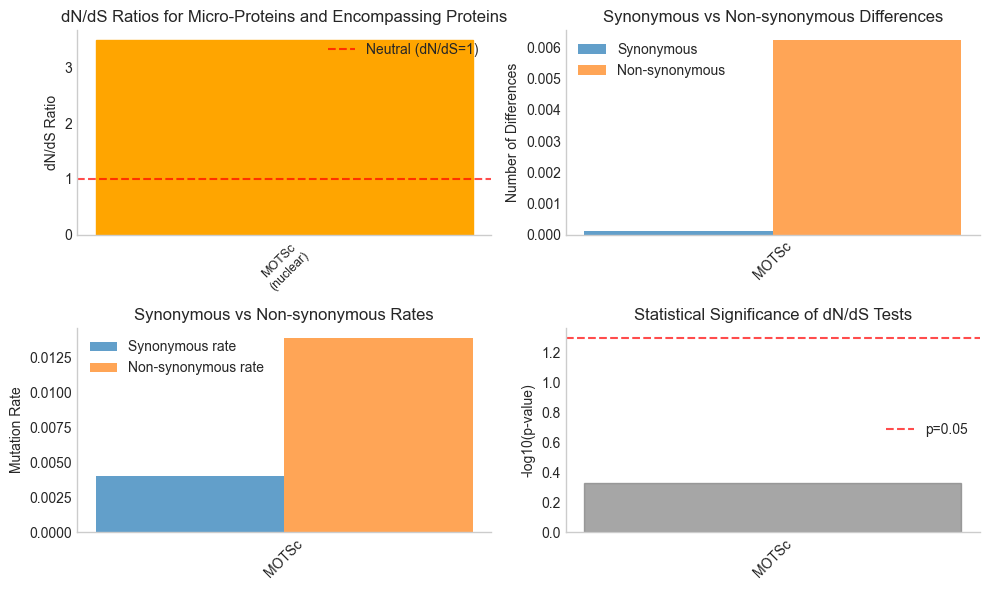

In [20]:
reload(mda)
# For RNR2 analysis
RNR1_MICROPROTEINS = [
    [695, 746, 'MOTSc', '+'],
]
# Define which genetic code each micro-protein uses
RNR1_GENETIC_CODES = {
    'MOTSc': 'nuclear',  # Translated in mitochondria

}

# Provide expected sequences for coordinate verification
RNR1_EXPECTED_SEQUENCES = {
}
# Run analysis with new features
results_rnr1 = mda.analyze_microprotein_dnds(
    df=hs_pop_df.dropna(subset=['RNR1']),
    microprotein_regions=RNR1_MICROPROTEINS,
    gene_name='RNR1',
    sequence_column='RNR1',
    expected_sequences=RNR1_EXPECTED_SEQUENCES,  # New!
    genetic_codes=RNR1_GENETIC_CODES,           # New!
    reference_sequence=ref_seq_rnr1,
    coordinate_search_window=50,                 # New!
    min_coordinate_similarity=0.8,              # New!
    plot_results=True,
    statistical_test = 'z_test_robust',
    output_file=os.path.join(PATH, 'figures','revision', 'rnr1_dnds_analysis.png'),
    min_frequency = 1e-5,
    figsize = (10, 6),
    weight_by_frequency = True,
)

# Access amino acid sequences
for name, mp_result in results_rnr1['microprotein_results'].items():
    print(f"{name}: {mp_result['sequence_info']['amino_acid_sequence']}")
    print(f"Genetic code: {mp_result['sequence_info']['genetic_code']}")
    print(f"Coordinates adjusted: {mp_result['coordinates']['coordinate_adjusted']}")

In [21]:
# Compare both methods
for name, n in results_rnr1['microprotein_results'].items():
    print(f"\n{name}:")
    print(f"  Unweighted dN/dS: {n['rates']['dnds_ratio']:.3f}")
    print(f"  Weighted dN/dS: {n['comparison_results']['rates']['dnds_ratio']:.3f}")
    print(f"  Difference: {abs(n['rates']['dnds_ratio'] - n['comparison_results']['rates']['dnds_ratio']):.3f}")


MOTSc:
  Unweighted dN/dS: 3.496
  Weighted dN/dS: 4.345
  Difference: 0.849


In [22]:
shmoose_overlaps_rel

[['SHMOOSE', 27, 204]]

In [23]:
ref_seq_ts2_tl2_nd5 = hs_pop_df[hs_pop_df['ID'] == 'NC_0129201']['TS2_TL2_ND5'].iloc[0]

2026-01-13 15:17:21,981 - INFO - Starting dN/dS analysis for TS2_TL2_ND5
2026-01-13 15:17:21,981 - INFO - Using Biopython method: NG86
2026-01-13 15:17:21,981 - INFO - Analyzing 1 micro-protein regions
2026-01-13 15:17:21,981 - INFO - Dataset contains 66271 sequences
2026-01-13 15:17:21,981 - INFO - Within protein mode: False
2026-01-13 15:17:21,981 - WARNING - Column 'TS2_TL2_ND5_seq' not found in DataFrame. Using TS2_TL2_ND5 as gene sequences.
2026-01-13 15:17:21,981 - INFO - Using provided reference sequence
2026-01-13 15:17:21,981 - WARNING - No reference gene sequence provided, using reference sequence for gene analysis
2026-01-13 15:17:21,991 - INFO - Subsampled from 66271 to 66271 sequences
2026-01-13 15:17:21,991 - INFO - Analyzing micro-protein: SHMOOSE (27-204, strand: +)
2026-01-13 15:17:21,991 - INFO - Using nuclear genetic code for SHMOOSE
2026-01-13 15:17:21,991 - INFO - Extracted reference sequence for SHMOOSE: ATGCCCCCATGTCTAACAACATGGCTTTCTCAACTTTTAAAGGATAACAGCTATCCATTG

Using 66271 sequences for gene TS2_TL2_ND5


2026-01-13 15:17:29,238 - INFO - out of 66271 sequences, 65955 were kept after cleaning for SHMOOSE
2026-01-13 15:17:29,248 - INFO - out of 59 codon positions, 59 were kept after cleaning for SHMOOSE
2026-01-13 15:17:29,248 - INFO - Found 268 unique variants for SHMOOSE after filtering
2026-01-13 15:17:30,260 - INFO - Total synonymous sites for SHMOOSE: 3.3517263454038515
2026-01-13 15:17:30,270 - INFO - Total non-synonymous sites for SHMOOSE: 44.32059569234913
2026-01-13 15:17:30,270 - INFO - Total synonymous differences for SHMOOSE: 0.05674031443624266
2026-01-13 15:17:30,270 - INFO - Total non-synonymous differences for SHMOOSE: 0.2937303628843931
2026-01-13 15:17:30,270 - INFO - Synonymous rate for SHMOOSE: 0.016929
2026-01-13 15:17:30,270 - INFO - Non-synonymous rate for SHMOOSE: 0.006627
2026-01-13 15:17:30,270 - INFO -   dN/dS ratio for SHMOOSE: 0.3915
2026-01-13 15:17:30,270 - INFO -   Synonymous rate: 0.016929
2026-01-13 15:17:30,270 - INFO -   Non-synonymous rate: 0.006627
20

SHMOOSE: MPPCLTTWLSQLLKDNSYPLVLGPKNFGATPNKSNNHAHYYNHPNPDFPNSPHPYHPR*
Genetic code: nuclear
Coordinates adjusted: False


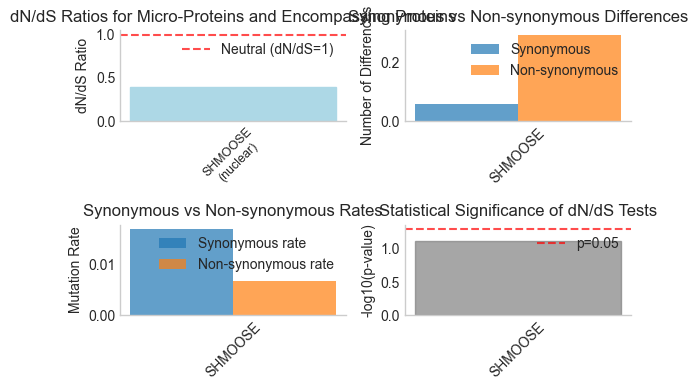

In [24]:
reload(mda)
# For shmoose analysis
SHMOOSE_MICROPROTEINS = [
    [27, 204, 'SHMOOSE', '+'],
]
# Define which genetic code each micro-protein uses
SHMOOSE_GENETIC_CODES = {
    'SHMOOSE': 'nuclear',  # Translated in mitochondria

}

# Provide expected sequences for coordinate verification
SHMOOSE_EXPECTED_SEQUENCES = {
}
# Run analysis with new features
results_shmoose = mda.analyze_microprotein_dnds(
    df=hs_pop_df.dropna(subset=['TS2_TL2_ND5']),
    microprotein_regions=SHMOOSE_MICROPROTEINS,
    gene_name='TS2_TL2_ND5',
    sequence_column='TS2_TL2_ND5',
    expected_sequences=SHMOOSE_EXPECTED_SEQUENCES,  # New!
    genetic_codes=SHMOOSE_GENETIC_CODES,           # New!
    coordinate_search_window=50,                 # New!
    reference_sequence=ref_seq_ts2_tl2_nd5,
    min_coordinate_similarity=0.8,              # New!
    plot_results=True,
    statistical_test = 'z_test_robust',
    output_file=os.path.join(PATH, 'figures', 'revision', 'shmoose_dnds_analysis.png'),
    min_frequency = 1e-5,
    figsize = (6, 4),
    weight_by_frequency = True,
)

# Access amino acid sequences
for name, mp_result in results_shmoose['microprotein_results'].items():
    print(f"{name}: {mp_result['sequence_info']['amino_acid_sequence']}")
    print(f"Genetic code: {mp_result['sequence_info']['genetic_code']}")
    print(f"Coordinates adjusted: {mp_result['coordinates']['coordinate_adjusted']}")

In [25]:
# Compare both methods
for name, n in results_shmoose['microprotein_results'].items():
    print(f"\n{name}:")
    print(f"  Unweighted dN/dS: {n['rates']['dnds_ratio']:.3f}")
    print(f"  Weighted dN/dS: {n['comparison_results']['rates']['dnds_ratio']:.3f}")
    print(f"  Difference: {abs(n['rates']['dnds_ratio'] - n['comparison_results']['rates']['dnds_ratio']):.3f}")


SHMOOSE:
  Unweighted dN/dS: 0.391
  Weighted dN/dS: 0.714
  Difference: 0.322


In [26]:
gau_overlaps_rel

[['GAU', 404, 686]]

2026-01-09 09:55:06,918 - INFO - Starting dN/dS analysis for COX1
2026-01-09 09:55:06,918 - INFO - Using Biopython method: NG86
2026-01-09 09:55:06,919 - INFO - Analyzing 1 micro-protein regions
2026-01-09 09:55:06,919 - INFO - Dataset contains 66315 sequences
2026-01-09 09:55:06,920 - INFO - Within protein mode: False
2026-01-09 09:55:06,922 - WARNING - Column 'COX1_seq' not found in DataFrame. Using COX1 as gene sequences.
2026-01-09 09:55:06,954 - INFO - Using most common sequence as reference
2026-01-09 09:55:06,971 - INFO - Using most common gene sequence as reference
2026-01-09 09:55:06,972 - INFO - Subsampled from 66315 to 66315 sequences
2026-01-09 09:55:06,972 - INFO - Analyzing micro-protein: GAU (404-686, strand: -)
2026-01-09 09:55:06,973 - INFO - Using nuclear genetic code for GAU
2026-01-09 09:55:06,973 - INFO - Extracted reference sequence for GAU: ATGGGGTCTCCTCCTCCGGCGGGGTCGAAGAAGGTGGTGTTGAGGTTGCGGTCTGTTAGTAGTATAGTGATGCCAGCAGCTAGGACTGGGAGAGATAGGAGAAGTAGGACTGCTGTGATTAGGA

Using 66315 sequences for gene COX1


2026-01-09 09:55:07,057 - INFO - Collected 66315 sequences for GAU from dataset
2026-01-09 09:55:07,057 - INFO - Sample sequence 1 for GAU: ATGGGGTCTCCTCCTCCGGCGGGGTCGAAGAAGGTGGTGTTGAGGTTGCGGTCTGTTAGTAGTATAGTGATGCCAGCAGCTAGGACTGGGAGAGATAGGAGAAGTAGGACTGCTGTGATTAGGACGGATCAGACGAAGAGGGGCGTTTGGTATTGGGTTATGGCAGGGGGTTTTATATTGATAATTGTTGTGATGAAATTGATGGCCCCTAAGATAGAGGAGACACCTGCTAGGTGTAAGGAGAAGATGGTTAGGTCTACGGAGGCTCCAGGGTGGGAGTAG
2026-01-09 09:55:07,058 - INFO - Sample sequence 2 for GAU: ATGGGGTCTCCTCCTCCGGCGGGGTCGAAGAAGGTGGTGTTGAGGTTGCGGTCTGTTAGTAGTATAGTGATGCCAGCAGCTAGGACTGGGAGAGATAGGAGAAGTAGGACTGCTGTGATTAGGACGGATCAGACAAAGAGGGGCGTTTGGTATTGGGTTATGGCAGGGGGTTTTATATTGATAATTGTTGTGATGAAATTGATGGCCCCTAAGATAGAGGAGACACCTGCTAGGTGTAAGGAGAAGATGGTTAGGTCTACGGAGGCTCCAGGGTGGGAGTAG
2026-01-09 09:55:07,058 - INFO - Sample sequence 3 for GAU: ATGGGGTCTCCTCCTCCGGCGGGGTCGAAGAAGGTGGTGTTGAGGTTGCGGTCTGTTAGTAGTATAGTGATGCCAGCAGCTAGGACTGGGAGAGATAGGAGAAGTAGGACTGCTGTGATTAGGACGGATCAGACGAAGAGGGGCGTTTGGTATTGGGTTATGGCAGGGGGTTTT

GAU: MGSPPPAGSKKVVLRLRSVSSIVMPAARTGRDRRSRTAVIRTDQTKRGVWYWVMAGGFILIIVVMKLMAPKIEETPARCKEKMVRSTEAPGWE*
Genetic code: nuclear
Coordinates adjusted: False


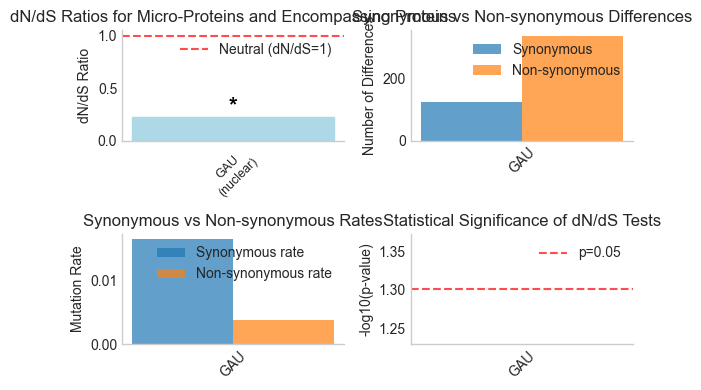

In [ ]:
reload(mda)
# For shmoose analysis
GAU_MICROPROTEINS = [
    [404, 686, 'GAU', '-'],
]
# Define which genetic code each micro-protein uses
GAU_GENETIC_CODES = {
    'GAU': 'nuclear',  # Translated in mitochondria

}

# Provide expected sequences for coordinate verification
GAU_EXPECTED_SEQUENCES = {
}
# Run analysis with new features
results_gau = mda.analyze_microprotein_dnds(
    df=hs_pop_df.dropna(subset=['COX1']),
    microprotein_regions=GAU_MICROPROTEINS,
    gene_name='COX1',
    sequence_column='COX1',
    expected_sequences=GAU_EXPECTED_SEQUENCES,  # New!
    genetic_codes=GAU_GENETIC_CODES,           # New!
    coordinate_search_window=50,                 # New!
    min_coordinate_similarity=0.8,              # New!
    plot_results=True,
    statistical_test = 'z_test_robust',
    output_file=os.path.join(PATH, 'figures', 'revision', 'gau_dnds_analysis.png'),
    min_frequency = 1e-5,
    figsize = (6, 4),
    weight_by_frequency = False,
)

# Access amino acid sequences
for name, mp_result in results_gau['microprotein_results'].items():
    print(f"{name}: {mp_result['sequence_info']['amino_acid_sequence']}")
    print(f"Genetic code: {mp_result['sequence_info']['genetic_code']}")
    print(f"Coordinates adjusted: {mp_result['coordinates']['coordinate_adjusted']}")

In [81]:
nad4_overlaps_rel

[['ALTND4', 797, 1097]]

In [82]:
ref_seq_nd4 = hs_pop_df[hs_pop_df['ID'] == 'NC_0129201']['ND4'].iloc[0]

2026-01-09 09:55:21,385 - INFO - Starting dN/dS analysis for ND4
2026-01-09 09:55:21,387 - INFO - Using Biopython method: NG86
2026-01-09 09:55:21,387 - INFO - Analyzing 1 micro-protein regions
2026-01-09 09:55:21,388 - INFO - Dataset contains 66316 sequences
2026-01-09 09:55:21,388 - INFO - Within protein mode: True
2026-01-09 09:55:21,390 - WARNING - Column 'ND4_seq' not found in DataFrame. Using ND4 as gene sequences.
2026-01-09 09:55:21,440 - INFO - Using most common sequence as reference
2026-01-09 09:55:21,462 - INFO - Using most common gene sequence as reference
2026-01-09 09:55:21,463 - INFO - Subsampled from 66316 to 66316 sequences
2026-01-09 09:55:21,464 - INFO - Analyzing micro-protein: ALTND4 (797-1097, strand: +)
2026-01-09 09:55:21,464 - INFO - Using nuclear genetic code for ALTND4
2026-01-09 09:55:21,465 - INFO - Extracted reference sequence for ALTND4: ATGAGGCATAATTATAACAAGCTCCATCTGCCTACGACAAACAGACCTAAAATCGCTCATTGCATACTCTTCAATCAGCCACATAGCCCTCGTAGTAACAGCCATTCTCATCCAAACC

Using 66316 sequences for gene ND4


2026-01-09 09:55:33,592 - INFO - out of 66316 sequences, 66112 were kept after cleaning for ALTND4
2026-01-09 09:55:33,593 - INFO - out of 100 codon positions, 100 were kept after cleaning for ALTND4
2026-01-09 09:55:33,603 - INFO - Found 324 unique variants for ALTND4 after filtering
2026-01-09 09:55:33,792 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling back to custom implementation.
2026-01-09 09:55:33,794 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling back to custom implementation.
2026-01-09 09:55:34,187 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling back to custom implementation.
2026-01-09 09:55:34,189 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling back to custom implementation.
2026-01-09 09:55:34,615 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling back to custom 

ALTND4: MRHNYNKLHLPTTNRPKIAHCILFNQPHSPRSNSHSHPNPLKLHRRSHSHNRPRAYILITILPSKLKLRTHSQSHHNPLSRTSNSTPTNSFLMTSSKPR*
Genetic code: nuclear
Coordinates adjusted: False


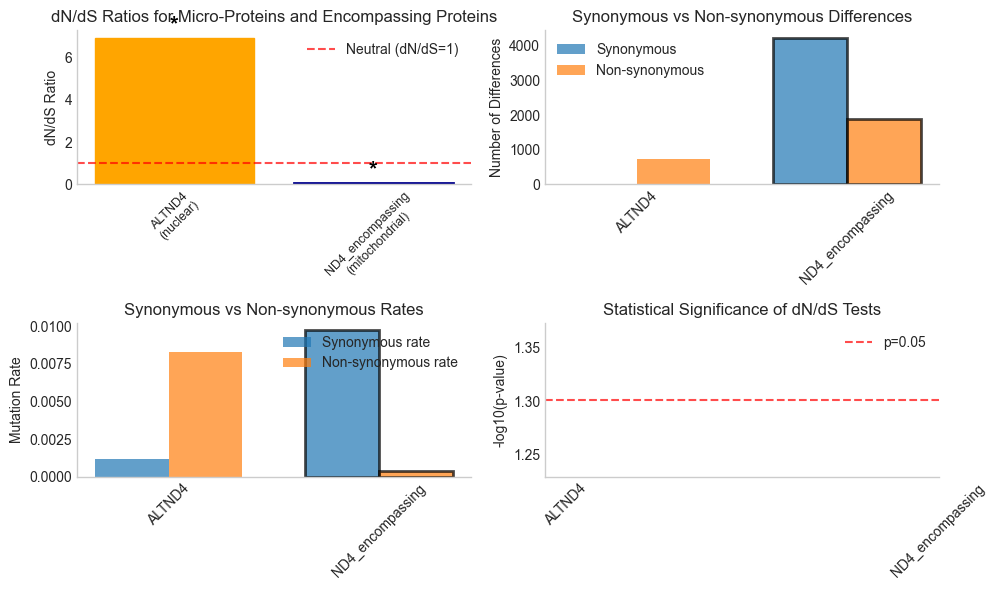

In [ ]:
reload(mda)
# For RNR2 analysis
ND4_MICROPROTEINS = [[797, 1097, 'ALTND4']]  # Use the nad4 overlap region
# Define which genetic code each micro-protein uses
ND4_GENETIC_CODES = {
    'ALTND4': 'nuclear',  # Translated in mitochondria
}

# Provide expected sequences for coordinate verification
ND4_EXPECTED_SEQUENCES = {
}
# Run analysis with new features
results_nd4_alt = mda.analyze_microprotein_dnds(
    df=hs_pop_df.dropna(subset=['ND4']),
    microprotein_regions=ND4_MICROPROTEINS,
    gene_name='ND4',
    sequence_column='ND4',
    expected_sequences=ND4_EXPECTED_SEQUENCES,  # New!
    genetic_codes=ND4_GENETIC_CODES,           # New!
    coordinate_search_window=50,                 # New!
    min_coordinate_similarity=0.8,              # New!
    within_protein_mode = True,
    plot_results=True,
    encompassing_genetic_code = 'mitochondrial',
    encompassing_gene_strand = '+',
    encompassing_gene_start = 1,  # Start position of the encompassing gene (1-based, absolute coordinates).
    encompassing_gene_reference_sequence = ref_seq_nd4,  # Reference sequence for the encompassing gene
    output_file=os.path.join(PATH, 'figures', 'revision', 'nd4_alt_dnds_analysis.png'),
    min_frequency = 1e-5,
    statistical_test='z_test_robust',
    figsize = (10, 6),
    max_sequences = 100000,
    weight_by_frequency = False,
)

# Access amino acid sequences
for name, mp_result in results_nd4_alt['microprotein_results'].items():
    print(f"{name}: {mp_result['sequence_info']['amino_acid_sequence']}")
    print(f"Genetic code: {mp_result['sequence_info']['genetic_code']}")
    print(f"Coordinates adjusted: {mp_result['coordinates']['coordinate_adjusted']}")

In [84]:
cyb_overlaps_rel

[['CYTB-187AA', 86, 650]]

In [85]:
cyb_ref_seq = hs_pop_df[hs_pop_df['ID'] == 'NC_0129201']['CYTB'].iloc[0]

2026-01-09 09:58:19,035 - INFO - Starting dN/dS analysis for CYTB
2026-01-09 09:58:19,036 - INFO - Using Biopython method: NG86
2026-01-09 09:58:19,036 - INFO - Analyzing 1 micro-protein regions
2026-01-09 09:58:19,037 - INFO - Dataset contains 66314 sequences
2026-01-09 09:58:19,037 - INFO - Within protein mode: True
2026-01-09 09:58:19,039 - WARNING - Column 'CYTB_seq' not found in DataFrame. Using CYTB as gene sequences.
2026-01-09 09:58:19,086 - INFO - Using most common sequence as reference
2026-01-09 09:58:19,107 - INFO - Using most common gene sequence as reference
2026-01-09 09:58:19,107 - INFO - Subsampled from 66314 to 66314 sequences
2026-01-09 09:58:19,108 - INFO - Analyzing micro-protein: CYTB-187AA (86-650, strand: +)
2026-01-09 09:58:19,109 - INFO - Using nuclear genetic code for CYTB-187AA
2026-01-09 09:58:19,109 - INFO - Extracted reference sequence for CYTB-187AA: ATGATGAAACTTCGGCTCACTCCTTGGCGCCTGCCTGATCCTCCAAATCACCACAGGACTATTCCTAGCCATGCACTACTCACCAGACGCCTCAACCGCCTTTTC

Using 66314 sequences for gene CYTB


2026-01-09 09:58:41,667 - INFO - out of 66314 sequences, 65833 were kept after cleaning for CYTB-187AA
2026-01-09 09:58:41,668 - INFO - out of 188 codon positions, 188 were kept after cleaning for CYTB-187AA
2026-01-09 09:58:41,678 - INFO - Found 1572 unique variants for CYTB-187AA after filtering
2026-01-09 09:58:42,208 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling back to custom implementation.
2026-01-09 09:58:42,210 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling back to custom implementation.
2026-01-09 09:58:42,537 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling back to custom implementation.
2026-01-09 09:58:42,538 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling back to custom implementation.
2026-01-09 09:58:44,891 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling ba

CYTB-187AA: MMKLRLTPWRLPDPPNHHRTIPSHALLTRRLNRLFINRPHHSRRKLWLNHPLPSRQWRLNILYLPLPTHRARPILRIISLLRNLKHRHYPPACNYSNSLHRLCPPVRPNIILRGHSNYKLTIRHPIHWDRPSSMNLRRLLSRQSHPHTILYLSLHLALHYCSPSSTPPPILARNGIKQPPRNHLPFR*
Genetic code: nuclear
Coordinates adjusted: False


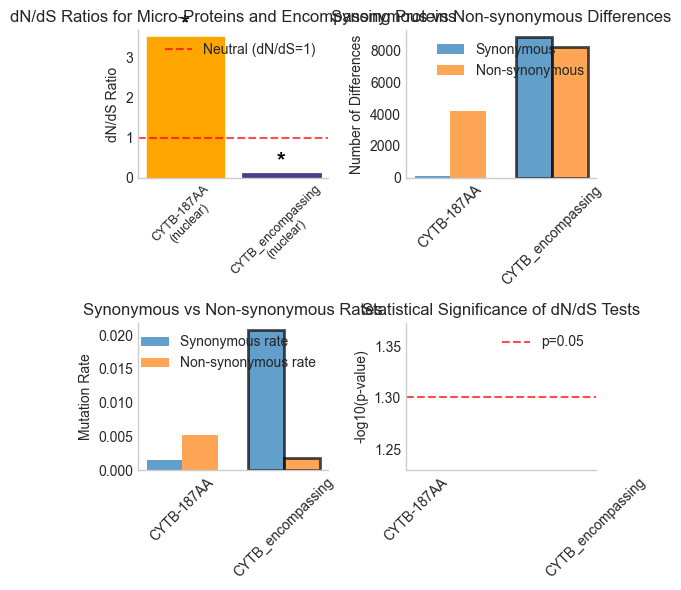

In [86]:
reload(mda)
# For RNR2 analysis
CYTB_MICROPROTEINS = [[86, 650, 'CYTB-187AA']]  # Use the nad4 overlap region
# Define which genetic code each micro-protein uses
CYTB_GENETIC_CODES = {
    'CYTB-187AA': 'nuclear',  # Translated in mitochondria
}

# Provide expected sequences for coordinate verification
CYTB_EXPECTED_SEQUENCES = {
}
# Run analysis with new features
results_cob_alt = mda.analyze_microprotein_dnds(
    df=hs_pop_df.dropna(subset=['CYTB']),
    microprotein_regions=CYTB_MICROPROTEINS,
    gene_name='CYTB',
    sequence_column='CYTB',
    expected_sequences=CYTB_EXPECTED_SEQUENCES,  # New!
    genetic_codes=CYTB_GENETIC_CODES,           # New!
    coordinate_search_window=50,                 # New!
    min_coordinate_similarity=0.8,              # New!
    within_protein_mode = True,
    encompassing_genetic_code = 'nuclear',
    encompassing_gene_strand = '+',
    encompassing_gene_start = 1,  # Start position
    encompassing_gene_reference_sequence = cyb_ref_seq,  # Reference sequence for the encompassing gene
    plot_results=True,
    output_file=os.path.join(PATH, 'figures', 'revision', 'cob_alt_dnds_analysis.png'),
    min_frequency = 1e-50,
    statistical_test='z_test_robust',
    weight_by_frequency = False,
    figsize = (6, 6),
    threshold = 0.1,
    max_sequences = 1000000
)

# Access amino acid sequences
for name, mp_result in results_cob_alt['microprotein_results'].items():
    print(f"{name}: {mp_result['sequence_info']['amino_acid_sequence']}")
    print(f"Genetic code: {mp_result['sequence_info']['genetic_code']}")
    print(f"Coordinates adjusted: {mp_result['coordinates']['coordinate_adjusted']}")

In [87]:
cox1_ref_seq = hs_pop_df[hs_pop_df['ID'] == 'NC_0129201']['COX1'].iloc[0]

2026-01-09 10:00:11,297 - INFO - Starting dN/dS analysis for COX1
2026-01-09 10:00:11,298 - INFO - Using Biopython method: NG86
2026-01-09 10:00:11,299 - INFO - Analyzing 1 micro-protein regions
2026-01-09 10:00:11,300 - INFO - Dataset contains 66315 sequences
2026-01-09 10:00:11,300 - INFO - Within protein mode: True
2026-01-09 10:00:11,302 - WARNING - Column 'COX1_seq' not found in DataFrame. Using COX1 as gene sequences.
2026-01-09 10:00:11,328 - INFO - Using most common sequence as reference
2026-01-09 10:00:11,351 - INFO - Using most common gene sequence as reference
2026-01-09 10:00:11,352 - INFO - Subsampled from 66315 to 66315 sequences
2026-01-09 10:00:11,353 - INFO - Analyzing micro-protein: ALTCO1 (185-965, strand: +)
2026-01-09 10:00:11,354 - INFO - Using mitochondrial genetic code for ALTCO1
2026-01-09 10:00:11,354 - INFO - Extracted reference sequence for ALTCO1: ATTTGTAATAATCTTCTTCATAGTAATACCCATCATAATCGGAGGCTTTGGCAACTGACTAGTTCCCCTAATAATCGGTGCCCCCGATATGGCGTTTCCCCGCATAAACA

Using 66315 sequences for gene COX1


2026-01-09 10:00:46,076 - INFO - out of 66315 sequences, 65238 were kept after cleaning for ALTCO1
2026-01-09 10:00:46,077 - INFO - out of 260 codon positions, 260 were kept after cleaning for ALTCO1
2026-01-09 10:00:46,087 - INFO - Found 1414 unique variants for ALTCO1 after filtering
2026-01-09 10:00:46,095 - WARNING - Biopython calculation failed: 'AGG'. Falling back to custom implementation.
2026-01-09 10:00:46,102 - WARNING - Biopython calculation failed: 'AGG'. Falling back to custom implementation.
2026-01-09 10:00:46,108 - WARNING - Biopython calculation failed: 'AGG'. Falling back to custom implementation.
2026-01-09 10:00:46,117 - WARNING - Biopython calculation failed: 'AGG'. Falling back to custom implementation.
2026-01-09 10:00:46,124 - WARNING - Biopython calculation failed: 'AGG'. Falling back to custom implementation.
2026-01-09 10:00:46,133 - WARNING - Biopython calculation failed: 'AGG'. Falling back to custom implementation.
2026-01-09 10:00:46,139 - WARNING - Biopy

ALTCO1: MCNNLLHSNTHHNRRLWQLTSSPNNRCPRYGVSPHKQHKLLTLTSLSPTPARICYSGGRSRNRLNSLPSLSRELLPPWSLRRPNHLLLTPSRCLLYLRGHQFHHNNYQYKTPCHNPMPNAPLRLIRPNHSSPTSPISPSPSCWHHYTTNRPQPQHHLLRPRRRRRPHSMPTPILIFRSPWSLYSYPTRLRNNLPYCNLLLRKKRTIWMHRYGLSYDINWLPRVYRVSTPYIYSRNRRRHTSMFHLRYHNHRYPHRRQSI*
Genetic code: mitochondrial
Coordinates adjusted: False


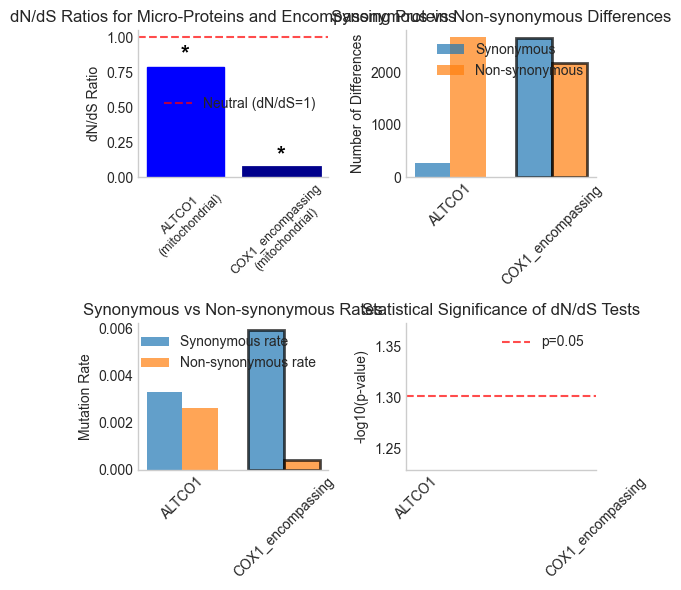

In [88]:
reload(mda)
# For RNR2 analysis
COX1_MICROPROTEINS = [[185, 965, 'ALTCO1']]  # Use the nad4 overlap region
# Define which genetic code each micro-protein uses
COX1_GENETIC_CODES = {
    'ALTCO1': 'mitochondrial',  # Translated in mitochondria
}

# Provide expected sequences for coordinate verification
COX1_EXPECTED_SEQUENCES = {
}
# Run analysis with new features
results_co1_alt = mda.analyze_microprotein_dnds(
    df=hs_pop_df.dropna(subset=['COX1']),
    microprotein_regions=COX1_MICROPROTEINS,
    gene_name='COX1',
    sequence_column='COX1',
    expected_sequences=COX1_EXPECTED_SEQUENCES,  # New!
    genetic_codes=COX1_GENETIC_CODES,           # New!
    coordinate_search_window=50,                 # New!
    min_coordinate_similarity=0.8,              # New!
    within_protein_mode = True,
    plot_results=True,
    output_file=os.path.join(PATH, 'figures', 'revision', 'co1_alt_dnds_analysis.png'),
    min_frequency = 1e-50,
    weight_by_frequency = False,
    statistical_test='z_test_robust',
    encompassing_genetic_code = 'mitochondrial',
    encompassing_gene_strand = '+',
    encompassing_gene_start = 1,  # Start position of the encompassing gene (1-based, absolute coordinates).
    encompassing_gene_reference_sequence = cox1_ref_seq,  # Reference sequence for the encompassing gene
    allow_att_start = True,
    figsize = (6, 6),
    max_sequences = 400050
)

# Access amino acid sequences
for name, mp_result in results_co1_alt['microprotein_results'].items():
    print(f"{name}: {mp_result['sequence_info']['amino_acid_sequence']}")
    print(f"Genetic code: {mp_result['sequence_info']['genetic_code']}")
    print(f"Coordinates adjusted: {mp_result['coordinates']['coordinate_adjusted']}")

In [89]:
results_df_mdps = pd.concat([results_rnr1['results_df'], results_rnr2['results_df']])
results_df_mdps.to_csv(os.path.join(PATH, 'data', 'mdps_dnds_results.csv'))

results_df_alts = pd.concat([results_co1_alt['results_df'], results_cob_alt['results_df'], results_nd4_alt['results_df']])
results_df_alts.to_csv(os.path.join(PATH, 'data', 'alt_frames_dnds_results.csv'))

# Combine all results into a single DataFrame
all_results_df = pd.concat([
    results_rnr1['results_df'],
    results_rnr2['results_df'],
    results_shmoose['results_df'],
    results_gau['results_df'],
    results_co1_alt['results_df'],
    results_cob_alt['results_df'],
    results_nd4_alt['results_df']
], ignore_index=True)
# Save the combined results DataFrame to a CSV file
all_results_df.to_csv(os.path.join(PATH, 'data', 'all_mdps_alts_dnds_results_revision_unweighted.csv'), index=False)

In [95]:
results_rnr2['microprotein_results']['SHLP6']

{'coordinates': {'absolute_start': 1319,
  'absolute_end': 1382,
  'strand': '+',
  'coordinate_adjusted': False},
 'sequence_info': {'length': 63,
  'reference_sequence': 'ATGTTGGATCAGGACATCCCGATGGTGCAGCCGCTATTAAAGGTTCGTTTGTTCAACGATTAA',
  'amino_acid_sequence': 'MLDQDIPMVQPLLKVRLFND*',
  'genetic_code': 'nuclear',
  'unique_variants': 11,
  'variants_above_frequency': 10,
  'variants_with_synonymous': 3,
  'variants_with_nonsynonymous': 8,
  'all_variants_with_synonymous': 3,
  'all_variants_with_nonsynonymous': 8,
  'total_sequences': 64789},
 'mutation_counts': {'synonymous_differences': 1.111391071436818,
  'nonsynonymous_differences': 9.901497937321775,
  'synonymous_sites': 41.111111111111114,
  'nonsynonymous_sites': 588.8888888888888},
 'rates': {'synonymous_rate': 0.027033836872787462,
  'nonsynonymous_rate': 0.016813864421867167,
  'dnds_ratio': 0.6219562728364384},
 'statistical_tests': {'statistic': np.float64(-2.9606007751736216),
  'p_value': np.float64(0.003582129290929

In [90]:
results_rnr1['microprotein_results']['MOTSc']['confidence_intervals']

{'synonymous_ci': (np.float64(0.0009751315146023308),
  np.float64(4.765291409046714)),
 'nonsynonymous_ci': (np.float64(27.03328679581303),
  np.float64(52.35368419411513))}

2026-01-09 10:04:01,374 - INFO - Creating combined plot for 3 gene analyses
2026-01-09 10:04:01,376 - INFO - Plotting 9 items from 3 genes


2026-01-09 10:04:01,920 - INFO - Combined plot saved to c:\Users\shtolz\Desktop\multi_function_review\figures\revision\combined_microprotein_analysis_mdps.png


,Gene,MicroProtein,AbsoluteStart,AbsoluteEnd,Strand,GeneticCode,Length,AminoAcidSequence,UniqueVariants,dN_dS_Ratio,SynonymousRate,NonsynonymousRate,Statistic,P_Value,Is_Significant,Test_Method,IsValid,ValidationIssues,CoordinateAdjusted
0,RNR1,MOTSc,695,746,+,nuclear,51,MRWQEMGYIFYPRKLR*,31,4.345033,0.006100,0.026506,13.555795,0.000000e+00,True,Robust Z-test,True,,False
1,RNR2,Hum,962,1037,+,nuclear,75,MAPRGFSCLLLLTSEIDLPVKRRA*,37,0.829074,0.014478,0.012003,-2.689316,7.159860e-03,True,Robust Z-test,True,,False
2,RNR2,SHLP1,814,889,-,nuclear,75,MCHWAGGASNTGDARGDVFGKQAG*,21,0.740939,0.015967,0.011831,-3.075339,2.943690e-03,True,Robust Z-test,True,,False
3,RNR2,SHLP2,417,498,-,nuclear,81,MGVKFFTLSTRFFPSVQRAVPLWTNS*,40,0.408179,0.026696,0.010897,-13.202626,0.000000e+00,True,Robust Z-test,True,,False
4,RNR2,SHLP3,32,149,-,nuclear,117,MLGYNFSSFPCGTISIAPGFNFYRLYFIWVNGLAKVVW*,130,0.310529,0.028099,0.008726,-37.412208,0.000000e+00,True,Robust Z-test,True,,False
5,RNR2,SHLP4,771,852,-,nuclear,81,MLEVMFLVNRRGKICRVPFTFFNLSL*,18,0.568982,0.013848,0.007879,-5.492682,9.237075e-08,True,Robust Z-test,True,,False
6,RNR2,SHLP5,1109,1184,-,nuclear,75,MYCSEVGFCSEVAPTEIFNAGLVV*,40,0.687675,0.018167,0.012493,-5.309238,1.926474e-07,True,Robust Z-test,True,,False
7,RNR2,SHLP6,1319,1382,+,nuclear,63,MLDQDIPMVQPLLKVRLFND*,11,0.621956,0.027034,0.016814,-2.960601,3.582129e-03,True,Robust Z-test,True,,False
8,TS2_TL2_ND5,SHMOOSE,27,204,+,nuclear,177,MPPCLTTWLSQLLKDNSYPLVLGPKNFGATPNKSNNHAHYYNHPNP...,268,0.713532,0.013998,0.009988,-18.760873,0.000000e+00,True,Robust Z-test,True,,False


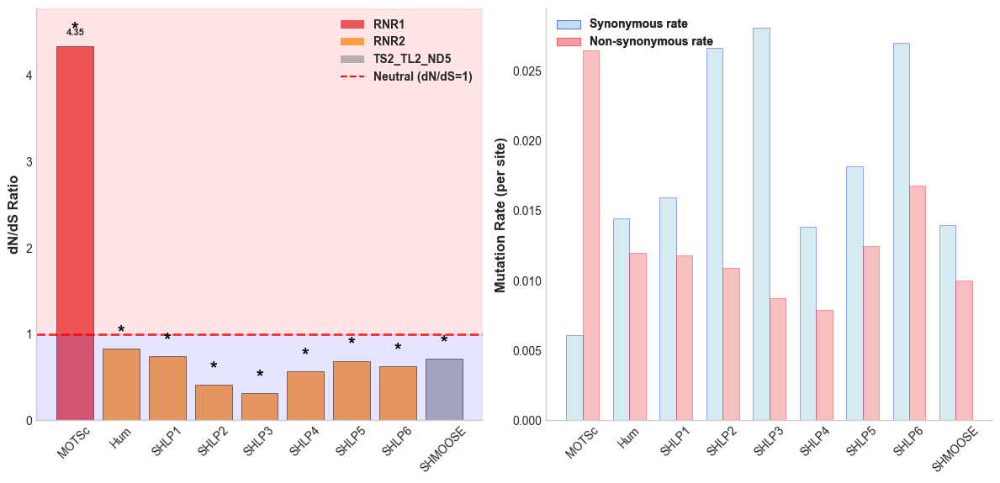

In [91]:
reload(mda)
# Create combined plot
combined_results_mdps = {
    'RNR1': results_rnr1,
    'RNR2': results_rnr2,
    'TS2_TL2_ND5': results_shmoose,
}

summary_table_mdps = mda.create_summary_table(combined_results_mdps)
mda.plot_combined_microprotein_analysis(
    results_dict=combined_results_mdps,
    output_file=os.path.join(PATH, 'figures', 'revision', 'combined_microprotein_analysis_mdps.png'),
    title='',
    figsize=(12, 6),
    show_genetic_codes=True,
    show_gene_labels=True,
    display_summary_text=False,
    include_encompassing_proteins = False,
    legend_outside = False,
)
display(summary_table_mdps)

In [92]:
summary_table_mdps[['MicroProtein', 'dN_dS_Ratio', 'Is_Significant']]

,MicroProtein,dN_dS_Ratio,Is_Significant
0,MOTSc,4.345033,True
1,Hum,0.829074,True
2,SHLP1,0.740939,True
3,SHLP2,0.408179,True
4,SHLP3,0.310529,True
5,SHLP4,0.568982,True
6,SHLP5,0.687675,True
7,SHLP6,0.621956,True
8,SHMOOSE,0.713532,True


2025-12-24 16:58:09,892 - INFO - Creating combined plot for 3 gene analyses
2025-12-24 16:58:09,892 - INFO - Plotting 6 items from 3 genes
2025-12-24 16:58:10,492 - INFO - Combined plot saved to c:\Users\shtolz\Desktop\multi_function_review\figures\revision\combined_microprotein_analysis_alter.png


,Gene,MicroProtein,AbsoluteStart,AbsoluteEnd,Strand,GeneticCode,Length,AminoAcidSequence,UniqueVariants,dN_dS_Ratio,...,IsValid,ValidationIssues,CoordinateAdjusted,EncompassingProtein,EncompassingProtein_Length,EncompassingProtein_dN_dS_Ratio,EncompassingProtein_Statistic,EncompassingProtein_P_Value,EncompassingProtein_Is_Significant,EncompassingProtein_Test_Method
0,ND4,ALTND4,797,1097,+,nuclear,300,MRHNYNKLHLPTTNRPKIAHCILFNQPHSPRSNSHSHPNPLKLHRR...,324,74.993003,...,True,,False,ND4,1380,0.019555,-35.978337,0.0,True,Robust Z-test
1,COX1,ALTCO1,185,965,+,mitochondrial,780,MCNNLLHSNTHHNRRLWQLTSSPNNRCPRYGVSPHKQHKLLTLTSL...,1414,1.073857,...,True,,False,COX1,1542,0.037452,-29.149285,0.0,True,Robust Z-test
2,CYTB,CYTB-187AA,86,650,+,nuclear,564,MMKLRLTPWRLPDPPNHHRTIPSHALLTRRLNRLFINRPHHSRRKL...,1572,6.210061,...,True,,False,CYTB,1143,0.103126,-19.631109,0.0,True,Robust Z-test


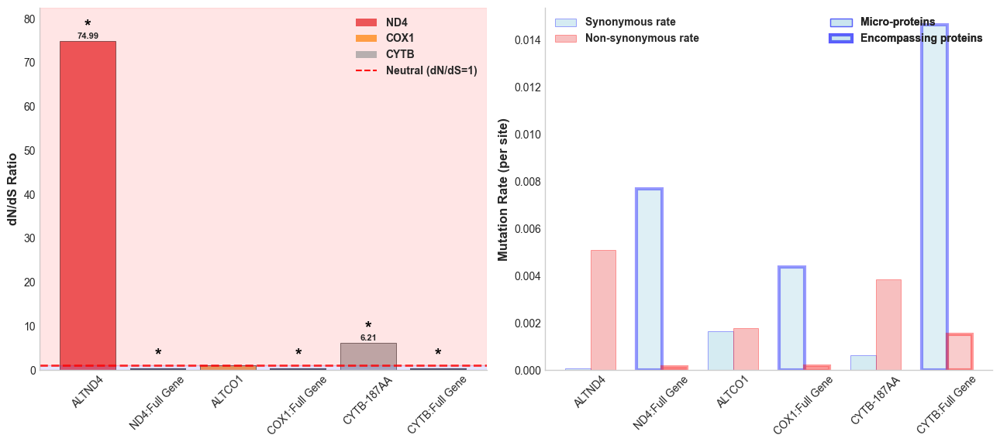

In [ ]:
reload(mda)
# Create combined plot
combined_results_alter = {
    'ND4' : results_nd4_alt,
    'COX1': results_co1_alt,
    'CYTB': results_cob_alt
}

summary_table_alter = mda.create_summary_table(combined_results_alter)
mda.plot_combined_microprotein_analysis(
    results_dict=combined_results_alter,
    output_file=os.path.join(PATH, 'figures', 'revision', 'combined_microprotein_analysis_alter.png'),
    title='',
    figsize=(13, 6),
    show_genetic_codes=True,
    show_gene_labels=True,
    display_summary_text=False,
    include_encompassing_proteins=True,
    legend_outside=False,
    break_axis_threshold = 100,
)
display(summary_table_alter)


In [ ]:
atp8_overlaps

[[8526, 8572, 'Overlap Region']]

In [ ]:
nad4L_nad4_overlaps_rel

[['Overlap Region', 290, 297]]

Extracting sequences for Overlap Region...
64709 64914 66313
Upstream start position: 0, Downstream start position: 290
Successfully found upstream and downstream genes in reference sequence.
Extracting overlap regions...
Number of overlap upstream frame sequences: 66278
Number of overlap downstream frame sequences: 66280
Most common overlap upstream sequence: CAATGCTAA
Most common overlap downstream sequence: ATGCTA
Calculating enhanced dN/dS ratios with statistical testing...


2026-01-01 13:51:37,965 - WARNING - Biopython calculation failed: 'AGA'. Falling back to custom implementation.
2026-01-01 13:51:38,519 - WARNING - Biopython calculation failed: 'AGA'. Falling back to custom implementation.
2026-01-01 13:51:38,561 - WARNING - Biopython calculation failed: 'AGA'. Falling back to custom implementation.
2026-01-01 13:51:38,820 - WARNING - Biopython calculation failed: 'AGA'. Falling back to custom implementation.
2026-01-01 13:51:43,643 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling back to custom implementation.
2026-01-01 13:52:10,361 - WARNING - Internal stop codons detected, cannot use Biopython dN/dS calculation. Falling back to custom implementation.
2026-01-01 13:52:23,056 - WARNING - Sequence length 1382 is not divisible by 3
2026-01-01 13:52:23,062 - WARNING - Sequences too short for reliable Biopython calculation (seq1: 6bp, seq2: 6bp). Minimum 12bp required. Falling back to custom implementation.
2026

Running enhanced sliding window analysis...
Skipping rare variant with frequency 0.0010
Skipping rare variant with frequency 0.0003
Skipping rare variant with frequency 0.0009
Skipping rare variant with frequency 0.0007
Skipping rare variant with frequency 0.0024
Skipping rare variant with frequency 0.0035
Skipping rare variant with frequency 0.0010
Skipping rare variant with frequency 0.0001
Skipping rare variant with frequency 0.0006
Skipping rare variant with frequency 0.0002
Skipping rare variant with frequency 0.0002
Skipping rare variant with frequency 0.0001
Skipping rare variant with frequency 0.0017
Skipping rare variant with frequency 0.0068
Skipping rare variant with frequency 0.0002
Skipping rare variant with frequency 0.0005
Skipping rare variant with frequency 0.0024
Skipping rare variant with frequency 0.0004
Skipping rare variant with frequency 0.0004
Skipping rare variant with frequency 0.0008
Skipping rare variant with frequency 0.0008
Skipping rare variant with frequ

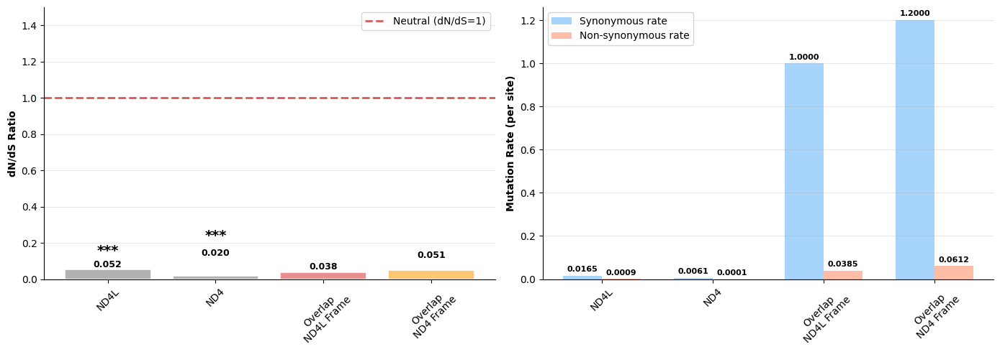

In [ ]:
reload(orfa)
# Overlapping reading frames with new plotting
result_nad4l_nad4 = orfa.analyze_overlapping_reading_frames_enhanced(
    [290, 297, 'Overlap Region'],
    hs_pop_df,
    'ND4L_ND4', 
    'ND4L',
    'ND4',
    'ND4L',
    'ND4',
    auto_plot=True,
    plot_config={'figsize': (14, 5), 'save_path': os.path.join(PATH, 'figures', 'revision', 'nad4l_nad4_overlap_analysis.png')},
    genetic_code = 'mitochondrial',
    statistical_test = 'z_test_robust',
    min_frequency = 1e-5,
)



In [ ]:
# Import Counter
from collections import Counter
test = ['ACT', 'ACT', 'GTA', 'TGC', 'ACT', 'GTA']
counted = Counter(test)
print(counted)

Counter({'ACT': 3, 'GTA': 2, 'TGC': 1})


In [ ]:
from enhanced_mtdna_dnds_analysis_biopython import get_fallback_stats, log_fallback_stats, reset_fallback_stats
stats = get_fallback_stats()
print(f"Fallback occurred {stats['fallback_calls']} out of {stats['total_calls']} calls ({stats['fallback_percentage']:.1f}%)")
log_fallback_stats()


2026-01-01 13:33:10,978 - INFO - No calls to calculate_synonymous_nonsynonymous yet.


Fallback occurred 0 out of 0 calls (0.0%)


In [ ]:
hs_pop_df

,ID,RNR2,RNR1,ATP8,ATP6,ATP8_ATP6,ND4L_ND4,ND4,ND4L,COX1,...,MOTC_seq,GAU_seq,shmoose_seq,CO1_alt_seq,ND4_alt_seq,CYB_alt_seq,ATP8_6_overlap_seq_upstream,ATP8_6_overlap_seq_downstream,ND4L_4_overlap_seq_upstream,ND4L_4_overlap_seq_downstream
0,PP1348631,GCTAAACCTAGCCCCAAACCCACTCCACCTTACTACCAGACAACCT...,AATAGGTTTGGTCCTAGCCTTTCTATTAGCTCTTAGTAAGATTACA...,ATGCCCCAACTAAATACTACCGTATGGCCCACCATAATTACCCCCA...,ATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTAG...,ATGCCCCAACTAAATACTACCGTATGGCCCACCATAATTACCCCCA...,ATGCCCCTCATTTACATAAATATTATACTAGCATTTACCATCTCAC...,ATGCTAAAACTAATCGTCCCAACAATTATATTACTACCACTGACAT...,ATGCCCCTCATTTACATAAATATTATACTAGCATTTACCATCTCAC...,ATGTTCGCCGACCGTTGACTATTCTCTACAAACCACAAAGACATTG...,...,ATGAGGTGGCAAGAAATGGGCTACATTTTCTACCCCAGAAAACTAC...,ATGGGGTCTCCTCCTCCGGCGGGGTCGAAGAAGGTGGTGTTGAGGT...,ATGCCCCCATGTCTAACAACATGGCTTTCTCAACTTTTAAAGGATA...,ATTTGTAATAATCTTCTTCATAGTAATACCCATCATAATCGGAGGC...,ATGAGGCATAATTATAACAAGCTCCATCTGCCTACGACAAACAGAC...,ATGATGAAACTTCGGCTCACTCCTTGGCGCCTGCCTGATCCTCCAA...,GAATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTAG,ATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTA,CAATGCTAA,ATGCTA
1,PV0673941,GCTAAACCTAGCCCCAAACCCACTCCACCTTACTACCAGACAACCT...,AATAGGTTTGGTCCTAGCCTTTCTATTAGCTCTTAGTAAGATTACA...,ATGCCCCAACTAAATACTACCGTATGGCCCACCATAATTACCCCCA...,ATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTAG...,ATGCCCCAACTAAATACTACCGTATGGCCCACCATAATTACCCCCA...,ATGCCCCTCATTTACATAAATATTATACTAGCATTTACCATCTCAC...,ATGCTAAAACTAATCGTCCCAACAATTATATTACTACCACTGACAT...,ATGCCCCTCATTTACATAAATATTATACTAGCATTTACCATCTCAC...,ATGTTCGCCGACCGTTGACTATTCTCTACAAACCACAAAGACATTG...,...,ATGAGGTGGCAAGAAATGGGCTACATTTTCTACCCCAGAAAACTAC...,ATGGGGTCTCCTCCTCCGGCGGGGTCGAAGAAGGTGGTGTTGAGGT...,ATGCCCCCATGTCTAACAACATGGCTTTCTCAACTTTTAAAGGATA...,ATTTGTAATAATCTTCTTCATAGTAATACCCATCATAATCGGAGGC...,ATGAGGCATAATTATAACAAGCTCCATCTGCCTACGACAAACAGAC...,ATGATGAAACTTCGGCTCACTCCTTGGCGCCTGCCTGATCCTCCAA...,AAATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTAG,ATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTA,CAATGCTAA,ATGCTA
2,PV0673931,GCTAAACCTAGCCCCAAACCCACTCCACCTTACTACCAGACAACCT...,AATAGGTTTGGTCCTAGCCTTTCTATTAGCTCTTAGTAAGATTACA...,ATGCCCCAACTAAATACTACCGTATGGCCCACCATAATTACCCCCA...,ATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTAG...,ATGCCCCAACTAAATACTACCGTATGGCCCACCATAATTACCCCCA...,ATGCCCCTCATTTACATAAATATTATACTAGCATTTACCATCTCAC...,ATGCTAAAACTAATCGTCCCAACAATTATATTACTACCACTGACAT...,ATGCCCCTCATTTACATAAATATTATACTAGCATTTACCATCTCAC...,ATGTTCGCCGACCGTTGACTATTCTCTACAAACCACAAAGACATTG...,...,ATGAGGTGGCAAGAAATGGGCTACATTTTCTACCCCAGAAAACTAC...,ATGGGGTCTCCTCCTCCGGCGGGGTCGAAGAAGGTGGTGTTGAGGT...,ATGCCCCCATGTCTAACAACATGGCTTTCTCAACTTTTAAAGGATA...,ATTTGTAATAATCTTCTTCATAGTAATACCCATCATAATCGGAGGC...,ATGAGGCATAATTATAACAAGCTCCATCTGCCTACGACAAACAGAC...,ATGATGAAACTTCGGCTCACTCCTTGGCGCCTGCCTGATCCTCCAA...,AAATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTAG,ATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTA,CAATGCTAA,ATGCTA
3,PV0673921,GCTAAACCTAGCCCCAAACCCACTCCACCTTACTACCAGACAACCT...,AATAGGTTTGGTCCTAGCCTTTCTATTAGCTCTTAGTAAGATTACA...,ATGCCCCAACTAAATACTACCGTATGGCCCACCATAATTACCCCCA...,ATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTAG...,ATGCCCCAACTAAATACTACCGTATGGCCCACCATAATTACCCCCA...,ATGCCCCTCATTTACATAAATATTATACTAGCATTTACCATCTCAC...,ATGCTAAAACTAATCGTCCCAACAATTATATTACTACCACTGACAT...,ATGCCCCTCATTTACATAAATATTATACTAGCATTTACCATCTCAC...,ATGTTCGCCGACCGTTGACTATTCTCTACAAACCACAAAGACATTG...,...,ATGAGGTGGCAAGAAATGGGCTACATTTTCTACCCCAGAAAACTAC...,ATGGGGTCTCCTCCTCCGGCGGGGTCGAAGAAGGTGGTGTTGAGGT...,ATGCCCCCATGTCTAACAACATGGCTTTCTCAACTTTTAAAGGATA...,ATTTGTAATAATCTTCTTCATAGTAATACCCATCATAATCGGAGGC...,ATGAGGCATAATTATAACAAGCTCCATCTGCCTACGACAAACAGAC...,ATGATGAAACTTCGGCTCACTCCTTGGCGCCTGCCTGATCCTCCAA...,AAATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTAG,ATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTA,CAATGCTAA,ATGCTA
4,PV0673911,GCTAAACCTAGCCCCAAACCCACTCCACCTTACTACCAGACAACCT...,AATAGGTTTGGTCCTAGCCTTTCTATTAGCTCTTAGTAAGATTACA...,ATGCCCCAACTAAATACTACCGTATGGCCCACCATAATTACCCCCA...,ATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTAG...,ATGCCCCAACTAAATACTACCGTATGGCCCACCA

In [ ]:
reload(orfa)
# Overlapping reading frames with new plotting
result_atp8_atp6 = orfa.analyze_overlapping_reading_frames_enhanced(
    [161, 207, 'Overlap Region'],
    hs_pop_df,
    'ATP8_ATP6', 
    'ATP8',
    'ATP6',
    'ATP8',
    'ATP6',
    auto_plot=True,
    plot_config={'figsize': (14, 5), 'save_path': os.path.join(PATH, 'figures', 'revision', 'atp8_atp6_overlap_analysis.png')},
    genetic_code = 'mitochondrial',
    statistical_test = 'z_test_robust',
    min_frequency = 1e-20,
)



NameError: name 'reload' is not defined

In [ ]:
atp8_atp6_summary = pd.DataFrame.from_dict(result_atp8_atp6['analyses'])
nd4l_nd4_summary = pd.DataFrame.from_dict(result_nad4l_nad4['analyses'])
# Drop the last two columns
atp8_atp6_summary = atp8_atp6_summary.iloc[:, :-2]
nd4l_nd4_summary = nd4l_nd4_summary.iloc[:, :-2]
atp8_atp6_summary.columns = ['ATP8', 'ATP6', 'Overlap ATP8 frame', 'Overlap ATP6 frame']
nd4l_nd4_summary.columns = ['ND4L', 'ND4', 'Overlap ND4L frame', 'Overlap ND4 frame']
# Combine
combined_summary = pd.concat([atp8_atp6_summary, nd4l_nd4_summary], axis=1)
combined_summary.to_csv(os.path.join(PATH, 'data', 'overlapping_frames_dnds_results.csv'))

In [ ]:
combined_summary

,ATP8,ATP6,Overlap ATP8 frame,Overlap ATP6 frame,ND4L,ND4,Overlap ND4L frame,Overlap ND4 frame
dnds_ratio,0.198402,0.615539,0.072295,2.813329,0.052152,0.019555,0.038462,0.05102
unique_variants,380,2706,49,44,272,3811,4,4
synonymous_sites,2.658666,57.444444,0.132096,0.120314,4.41164,114.555556,0.000015,0.000025
nonsynonymous_sites,32.975107,623.555556,1.70873,1.451535,47.083184,1265.444444,0.000392,0.000246
synonymous_changes,0.044889,0.12151,0.010353,0.001227,0.072708,0.698119,0.000015,0.00003
nonsynonymous_changes,0.11046,0.811888,0.009682,0.041645,0.040469,0.150805,0.000015,0.000015
synonymous_rate,0.016884,0.002115,0.078378,0.010198,0.016481,0.006094,1.0,1.2
nonsynonymous_rate,0.00335,0.001302,0.005666,0.02869,0.00086,0.000119,0.038462,0.061224
n_sequences,65271,64737,65840,65846,64914,64709,66278,66280
p_value,0.005997,0.00041,0.065531,0.477919,0.0,0.0,0.103233,0.13676


Generating enhanced summary plots...


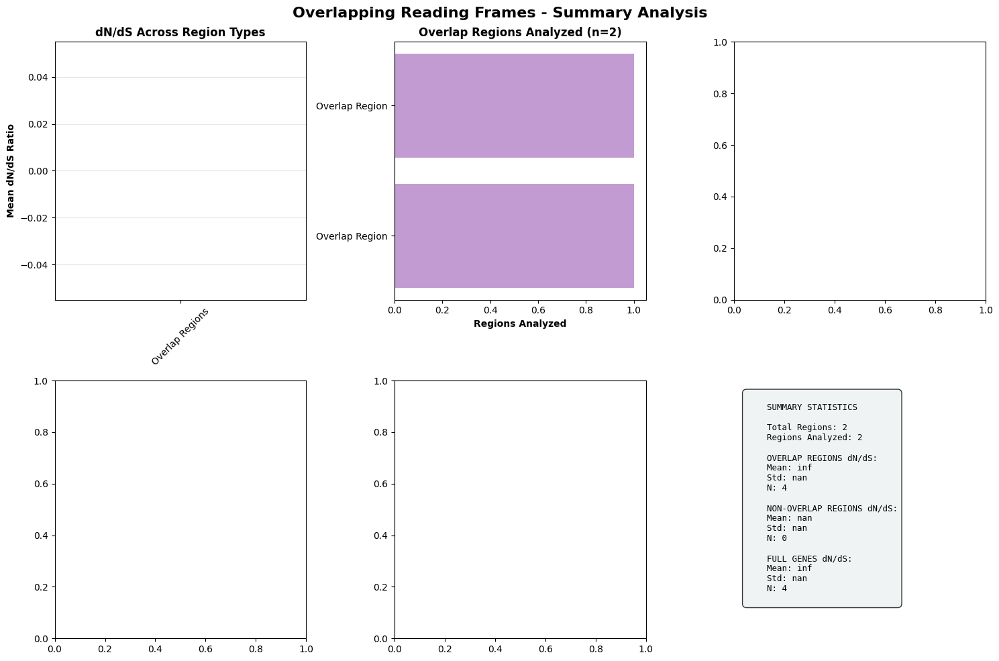

{'total_regions': 2,
 'regions_analyzed': ['Overlap Region', 'Overlap Region'],
 'statistics': {'overlap_regions': {'mean': np.float64(inf),
   'std': np.float64(nan),
   'n': 4},
  'non_overlap_regions': {'mean': nan, 'std': nan, 'n': 0},
  'full_genes': {'mean': np.float64(inf), 'std': np.float64(nan), 'n': 4},
  'window_overlap': {'mean': nan, 'std': nan, 'n': 0},
  'window_normal': {'mean': np.float64(inf), 'std': np.float64(nan), 'n': 4}},
 'summary_figure': <Figure size 1500x1000 with 6 Axes>}

In [ ]:
orfa.summarize_overlapping_frame_results(
    [result_nad4l_nad4, result_atp8_atp6],)

In [28]:
# for rnr2_overlaps_rel, rnr1_overlaps_rel, gau_overlaps_rel and shmoose_overlaps_rel, convert the structure from [[name, start, end], ...] to [[start, end, name, strand], ...]
rnr2_overlaps_rel_structured = []
for overlap in rnr2_overlaps_rel:
    rnr2_overlaps_rel_structured.append([overlap[1], overlap[2], overlap[0], '+' if overlap[0] == 'Hum' or overlap[0] == 'SHLP6' else '-'])
rnr1_overlaps_rel_structured = []
for overlap in rnr1_overlaps_rel:
    rnr1_overlaps_rel_structured.append([overlap[1], overlap[2], overlap[0], '+'])  
gau_overlaps_rel_structured = []
for overlap in gau_overlaps_rel:
    gau_overlaps_rel_structured.append([overlap[1], overlap[2], overlap[0], '-'])
shmoose_overlaps_rel_structured = []
for overlap in shmoose_overlaps_rel:
    shmoose_overlaps_rel_structured.append([overlap[1], overlap[2], overlap[0], '+'])
co1_overlaps_rel_structured = []
for overlap in co1_overlaps_rel:
    co1_overlaps_rel_structured.append([overlap[1], overlap[2], overlap[0], '+'])
nad4_overlaps_rel_structured = []
for overlap in nad4_overlaps_rel:
    nad4_overlaps_rel_structured.append([overlap[1], overlap[2], overlap[0], '+'])
cyb_overlaps_rel_structured = []
for overlap in cyb_overlaps_rel:
    cyb_overlaps_rel_structured.append([overlap[1], overlap[2], overlap[0], '+'])

2026-01-13 15:32:21,325 - INFO - Applied reverse complement for SHLP3 (32-149)
2026-01-13 15:32:21,325 - INFO - Extracted 64933 sequences for SHLP3 (32-149) 
2026-01-13 15:32:21,400 - INFO - Applied reverse complement for SHLP2 (417-498)
2026-01-13 15:32:21,400 - INFO - Extracted 64933 sequences for SHLP2 (417-498) 
2026-01-13 15:32:21,462 - INFO - Applied reverse complement for SHLP4 (771-852)
2026-01-13 15:32:21,462 - INFO - Extracted 64933 sequences for SHLP4 (771-852) 
2026-01-13 15:32:21,530 - INFO - Applied reverse complement for SHLP1 (814-889)
2026-01-13 15:32:21,530 - INFO - Extracted 64933 sequences for SHLP1 (814-889) 
2026-01-13 15:32:21,555 - INFO - Extracted 64933 sequences for Hum (962-1037) 
2026-01-13 15:32:21,623 - INFO - Applied reverse complement for SHLP5 (1109-1184)
2026-01-13 15:32:21,624 - INFO - Extracted 64933 sequences for SHLP5 (1109-1184) 
2026-01-13 15:32:21,640 - INFO - Extracted 64933 sequences for SHLP6 (1319-1382) 
2026-01-13 15:32:21,653 - INFO - Extr

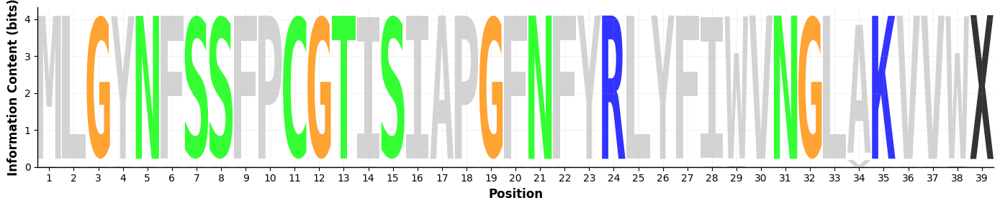

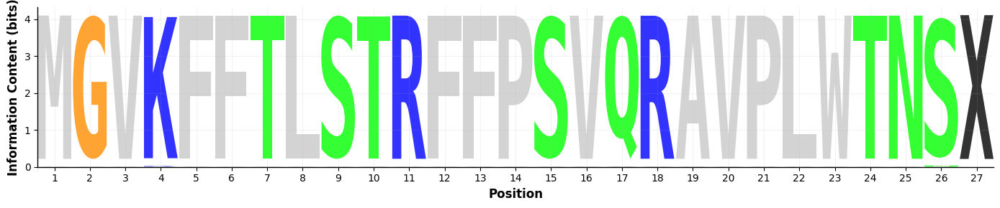

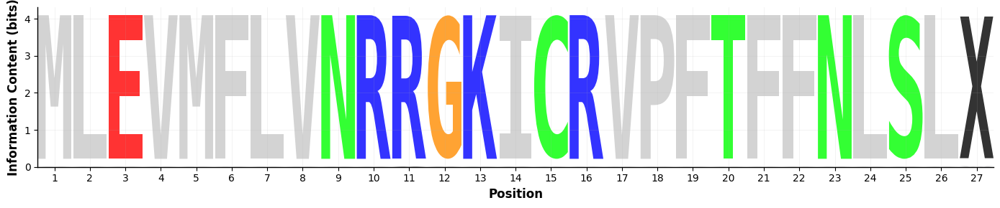

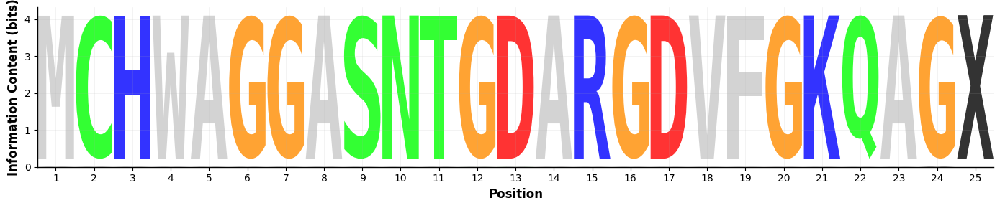

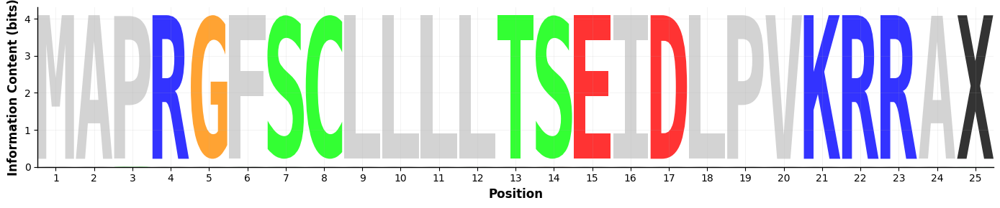

...

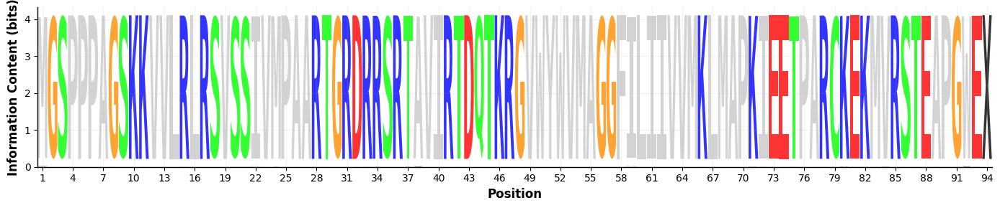

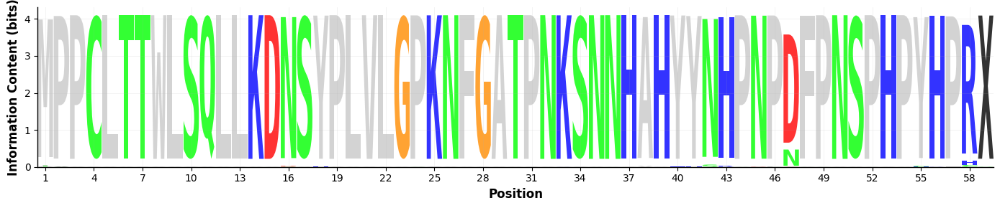

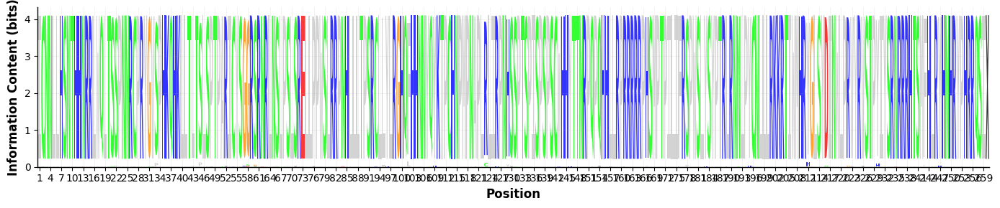

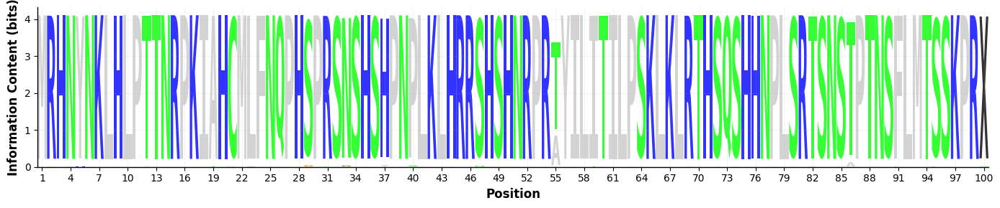

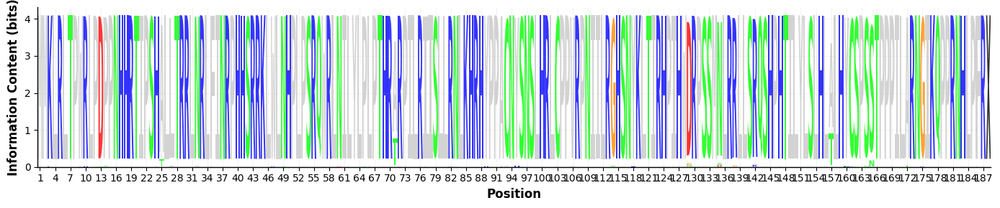

In [ ]:
reload(slc)
sequences_dict_rnr2 = slc.extract_microprotein_sequences(
    dataframe=hs_pop_df,
    sequence_column='RNR2',
    microprotein_regions=rnr2_overlaps_rel_structured,
)
sequences_dict_rnr1 = slc.extract_microprotein_sequences(
    dataframe=hs_pop_df,
    sequence_column='RNR1',
    microprotein_regions=rnr1_overlaps_rel_structured,
)
sequences_dict_gau = slc.extract_microprotein_sequences(
    dataframe=hs_pop_df,
    sequence_column='COX1',
    microprotein_regions=gau_overlaps_rel_structured,
)
sequences_dict_shmoose = slc.extract_microprotein_sequences(
    dataframe=hs_pop_df,
    sequence_column='TS2_TL2_ND5',
    microprotein_regions=shmoose_overlaps_rel_structured,
)
sequences_dict_co1_alt = slc.extract_microprotein_sequences(
    dataframe=hs_pop_df,
    sequence_column='COX1',
    microprotein_regions=co1_overlaps_rel_structured,
)
sequences_dict_nd4_alt = slc.extract_microprotein_sequences(
    dataframe=hs_pop_df,
    sequence_column='ND4',
    microprotein_regions=nad4_overlaps_rel_structured,
)
sequences_dict_cyb_alt = slc.extract_microprotein_sequences(
    dataframe=hs_pop_df,
    sequence_column='CYTB', 
    microprotein_regions=cyb_overlaps_rel_structured,
)
# Combine all sequences into a single dict
sequences_dict = {**sequences_dict_rnr2, **sequences_dict_rnr1, **sequences_dict_gau, **sequences_dict_shmoose, **sequences_dict_co1_alt, **sequences_dict_nd4_alt, **sequences_dict_cyb_alt}
# Create all logos
logo_results, logo_summary = slc.create_multiple_sequence_logos(
    sequences_dict=sequences_dict,
    genetic_codes={'MOTS-c': 'nuclear', 'Hum': 'nuclear', 'SHLP1': 'nuclear', 'SHLP2': 'nuclear', 'SHLP3': 'nuclear', 'SHLP4': 'nuclear', 'SHLP5': 'nuclear', 'SHLP6': 'nuclear', 'SHMOOSE': 'nuclear', 'GAU': 'nuclear',
                   'ALTCO1': 'mitochondrial', 'ALTND4': 'mitochondrial', 'CYTB-187AA': 'nuclear'},
    output_dir=os.path.join(PATH, 'figures', 'revision', 'sequence_logos', 'all_microproteins_sequence_logos'),
    color_scheme='NajafabadiEtAl2017',
    figsize=(14, 3),
    min_frequency=0.00001,
    information_box = False,
    show_conservation = False,
    title = '',
    statistical_test = True,
    n_permutations = 100,
#    mark_stop_codons = True
)
# Compare conservation
#slc.compare_conservation_across_microproteins(
#   logo_results,
#    output_file=os.path.join(PATH, 'figures', 'conservation_comparison_all.png')
#)


In [31]:
logo_results

,microprotein_name,n_sequences,sequence_length_aa,genetic_code,mean_conservation_bits,max_conservation_bits,invariant_positions,min_frequency_threshold,mean_variants_per_position,median_variants_per_position,max_variants_per_position,min_variants_per_position,positions_with_multiple_variants,percent_positions_with_multiple_variants,stat_test_pvalue,stat_test_significant,mean_background_conservation
0,SHLP3,64933,39,nuclear,4.298322,4.321928,39,0.00001,3.205128,3.0,6,1,38,97.435897,0.0,True,2.924229
1,SHLP2,64933,27,nuclear,4.303101,4.321928,27,0.00001,2.777778,3.0,5,1,26,96.296296,0.0,True,2.582555
2,SHLP4,64933,27,nuclear,4.308773,4.312853,27,0.00001,2.333333,2.0,4,2,27,100.000000,0.0,True,2.676682
3,SHLP1,64933,25,nuclear,4.309318,4.321391,25,0.00001,2.520000,2.0,4,2,25,100.000000,0.0,True,4.023913
4,Hum,64933,25,nuclear,4.307325,4.310858,25,0.00001,2.880000,3.0,5,2,25,100.000000,0.0,True,3.870698
5,SHLP5,64933,25,nuclear,4.308050,4.321196,25,0.00001,2.960000,3.0,6,2,25,100.000000,0.0,True,3.668546
6,SHLP6,64933,21,nuclear,4.311108,4.321660,21,0.00001,2.619048,2.0,5,2,21,100.000000,0.0,True,2.714365
7,MOTSc,65719,17,mitochondrial,4.309148,4.314344,17,0.00001,3.588235,3.0,6,2,17,100.000000,0.0,True,2.058262
8,GAU,66315,94,nuclear,4.311993,4.321928,94,0.00001,3.329787,3.0,6,1,93,98.936170,0.0,True,1.385493
9,SHMOOSE,66271,59,nuclear,4.288945,4.315912,58,0.00001,3.525424,3.0,7,2,59,100.000000,0.0,True,3.734581


Heatmap summary saved to c:\Users\shtolz\Desktop\multi_function_review\figures\revision\mdp_heatmap_summary.png


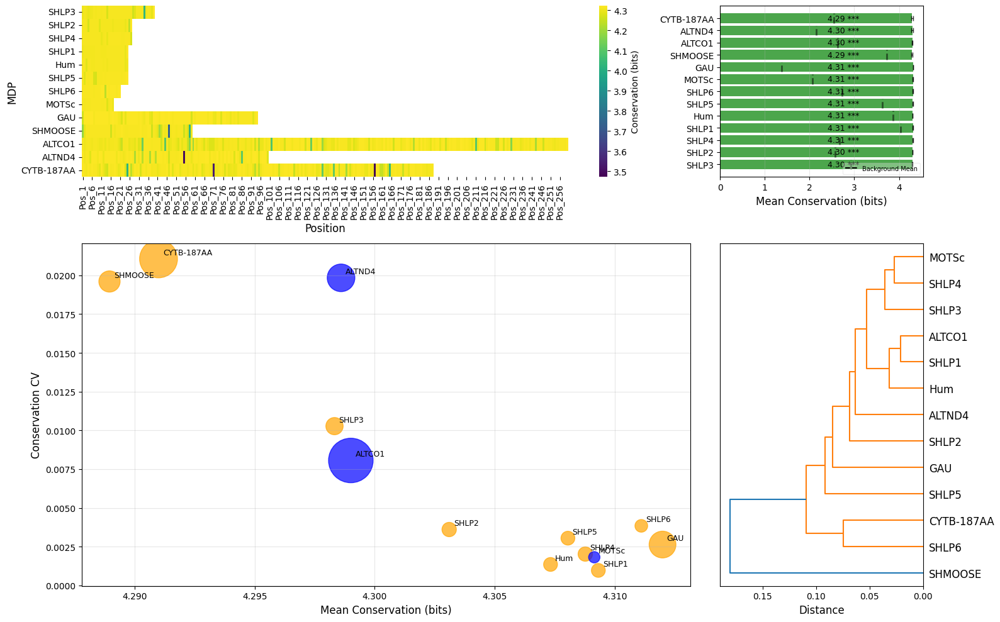

In [36]:
reload(slc)
summary_logo = slc.create_mdp_heatmap_summary(logo_results, output_file = os.path.join(PATH, 'figures', 'revision', 'mdp_heatmap_summary.png'))

In [ ]:
import enhanced_sequence_logo_creator_nuc as eslcn
reload(eslcn)
sequences_dict = eslcn.extract_microprotein_sequences(
    dataframe=hs_pop_df,
    sequence_column='RNR2',
    microprotein_regions=rnr2_overlaps_rel_structured,
)
# Multiple nucleotide logos
nt_results_dict = eslcn.create_multiple_nucleotide_logos(
    sequences_dict=sequences_dict,
    output_dir=os.path.join(PATH, 'figures', 'revision', 'nucleotide_logos', 'rnr2_microprotein_nucleotide_logos'),
    color_scheme='taylor',
    figsize=(20, 3),
    min_frequency=0.00001,
    information_box=False,
    show_conservation = False,
    show_numbers = False
)

In [33]:
import enhanced_sequence_logo_creator_nuc as oslc
reload(oslc)
summary_logo = oslc.create_mdp_heatmap_summary(logo_results, output_file = os.path.join(PATH, 'figures', 'mdp_heatmap_summary.png'))

AttributeError: module 'enhanced_sequence_logo_creator_nuc' has no attribute 'create_mdp_heatmap_summary'

In [ ]:
summary_logo[0]

,MDP,Length,Mean_Conservation,Max_Conservation,Min_Conservation,Conservation_CV,N_Sequences,Genetic_Code
0,SHLP3,39,4.298322,4.321928,4.035386,0.010275,64933,nuclear
1,SHLP2,27,4.303101,4.321928,4.241683,0.003607,64933,nuclear
2,SHLP4,27,4.308773,4.312853,4.271443,0.002024,64933,nuclear
3,SHLP1,25,4.309318,4.321391,4.295304,0.000970,64933,nuclear
4,Hum,25,4.307325,4.310858,4.284945,0.001355,64933,nuclear
5,SHLP5,25,4.308050,4.321196,4.265688,0.003050,64933,nuclear
6,SHLP6,21,4.311108,4.321660,4.237511,0.003844,64933,nuclear
7,MOTSc,17,4.309148,4.314344,4.280985,0.001819,65719,mitochondrial
8,GAU,94,4.311993,4.321928,4.263150,0.002637,66315,nuclear
9,SHMOOSE,59,4.288945,4.315912,3.740333,0.019605,66271,nuclear


In [31]:
reload(slc)
slc.create_mdp_selection_summary(logo_results, dnds_results_dict = combined_results_mdps['RNR2'])

AttributeError: module 'enhanced_sequence_logo_creator' has no attribute 'create_mdp_selection_summary'

In [ ]:
string = 'ATGCGTACGTAGCTAGCTAGCTAGCTAGCTAGCTAGCTAGCTAGCTAGCTAGCTAGCTAGC'

# Split string every 3 characters and add a space
split_string = ' '.join([string[i:i+3] for i in range(0, len(string), 3)])
print(split_string)